# Use case 1 - Binomial Classification(Attack/Normal)

In [1]:
#Importing necessary packages
import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sb
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn import svm
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from IPython.display import display, HTML
from collections import Counter
from matplotlib.pylab import rcParams
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import precision_recall_curve
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\compat\pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


In [2]:
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

In [74]:
# Loading Training data
data_train = pd.read_excel('C:\\Users\\Anindam\\Downloads\\Train_data.xlsx',header = None)

In [75]:
# Renaming columns
data_train.columns = ['duration','protocol_type','service','flag','src_bytes','dst_bytes','land','wrong_fragment','urgent','hot','num_failed_logins','logged_in','num_compromised','root_shell','su_attempted','num_root','num_file_creations','num_shells','num_access_files','num_outbound_cmds','is_host_login','is_guest_login','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate','attack','last_flag']

In [76]:
# Loading Testing data
data_test = pd.read_excel('C:\\Users\\Anindam\\Downloads\\Test_data.xlsx',header = None)

In [77]:
# Renaming columns
data_test.columns = ['duration','protocol_type','service','flag','src_bytes','dst_bytes','land','wrong_fragment','urgent','hot','num_failed_logins','logged_in','num_compromised','root_shell','su_attempted','num_root','num_file_creations','num_shells','num_access_files','num_outbound_cmds','is_host_login','is_guest_login','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate','attack','last_flag']

## Statistics for Training data

In [6]:
data_train.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,last_flag
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,20
1,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,15
2,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,19
3,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,21
4,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,21


In [7]:
data_train.shape

(125973, 43)

In [8]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125973 entries, 0 to 125972
Data columns (total 43 columns):
duration                       125973 non-null int64
protocol_type                  125973 non-null object
service                        125973 non-null object
flag                           125973 non-null object
src_bytes                      125973 non-null int64
dst_bytes                      125973 non-null int64
land                           125973 non-null int64
wrong_fragment                 125973 non-null int64
urgent                         125973 non-null int64
hot                            125973 non-null int64
num_failed_logins              125973 non-null int64
logged_in                      125973 non-null int64
num_compromised                125973 non-null int64
root_shell                     125973 non-null int64
su_attempted                   125973 non-null int64
num_root                       125973 non-null int64
num_file_creations             125973 

In [9]:
data_train.describe()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,last_flag
count,125973.00000,1.259730e+05,1.259730e+05,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,...,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000,125973.000000
mean,287.14465,4.556674e+04,1.977911e+04,0.000198,0.022687,0.000111,0.204409,0.001222,0.395736,0.279250,...,115.653005,0.521242,0.082951,0.148379,0.032542,0.284452,0.278485,0.118832,0.120240,19.504060
std,2604.51531,5.870331e+06,4.021269e+06,0.014086,0.253530,0.014366,2.149968,0.045239,0.489010,23.942042,...,110.702741,0.448949,0.188922,0.308997,0.112564,0.444784,0.445669,0.306557,0.319459,2.291503
min,0.00000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.00000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,10.000000,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000
50%,0.00000,4.400000e+01,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,63.000000,0.510000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000
75%,0.00000,2.760000e+02,5.160000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,255.000000,1.000000,0.070000,0.060000,0.020000,1.000000,1.000000,0.000000,0.000000,21.000000
max,42908.00000,1.379964e+09,1.309937e+09,1.000000,3.000000,3.000000,77.000000,5.000000,1.000000,7479.000000,...,255.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,21.000000


In [10]:
#Function to print all features in data_train
def printall(data_train, max_rows = 20):
    display(HTML(data_train.to_html(max_rows = max_rows)))
printall(data_train)

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,last_flag
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,0.00,0.00,0.0,0.0,1.00,0.00,0.00,150,25,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,20
1,0,udp,other,SF,146,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13,1,0.00,0.00,0.0,0.0,0.08,0.15,0.00,255,1,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,15
2,0,tcp,private,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,123,6,1.00,1.00,0.0,0.0,0.05,0.07,0.00,255,26,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,19
3,0,tcp,http,SF,232,8153,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,5,5,0.20,0.20,0.0,0.0,1.00,0.00,0.00,30,255,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,21
4,0,tcp,http,SF,199,420,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,30,32,0.00,0.00,0.0,0.0,1.00,0.00,0.09,255,255,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,21
5,0,tcp,private,REJ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,121,19,0.00,0.00,1.0,1.0,0.16,0.06,0.00,255,19,0.07,0.07,0.00,0.00,0.00,0.00,1.00,1.00,neptune,21
6,0,tcp,private,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,166,9,1.00,1.00,0.0,0.0,0.05,0.06,0.00,255,9,0.04,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,21
7,0,tcp,private,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,117,16,1.00,1.00,0.0,0.0,0.14,0.06,0.00,255,15,0.06,0.07,0.00,0.00,1.00,1.00,0.00,0.00,neptune,21
8,0,tcp,remote_job,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,270,23,1.00,1.00,0.0,0.0,0.09,0.05,0.00,255,23,0.09,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,21
9,0,tcp,private,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,133,8,1.00,1.00,0.0,0.0,0.06,0.06,0.00,255,13,0.05,0.06,0.00,0.00,1.00,1.00,0.00,0.00,neptune,21


In [11]:
Counter(data_train.attack)

Counter({'back': 956,
         'buffer_overflow': 30,
         'ftp_write': 8,
         'guess_passwd': 53,
         'imap': 11,
         'ipsweep': 3599,
         'land': 18,
         'loadmodule': 9,
         'multihop': 7,
         'neptune': 41214,
         'nmap': 1493,
         'normal': 67343,
         'perl': 3,
         'phf': 4,
         'pod': 201,
         'portsweep': 2931,
         'rootkit': 10,
         'satan': 3633,
         'smurf': 2646,
         'spy': 2,
         'teardrop': 892,
         'warezclient': 890,
         'warezmaster': 20})

In [12]:
Counter(data_train.flag)

Counter({'OTH': 46,
         'REJ': 11233,
         'RSTO': 1562,
         'RSTOS0': 103,
         'RSTR': 2421,
         'S0': 34851,
         'S1': 365,
         'S2': 127,
         'S3': 49,
         'SF': 74945,
         'SH': 271})

## Statistics for Testing data

In [13]:
data_test.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,last_flag
0,0,tcp,private,REJ,0,0,0,0,0,0,...,0.04,0.06,0.00,0.00,0.0,0.0,1.00,1.00,neptune,21
1,0,tcp,private,REJ,0,0,0,0,0,0,...,0.00,0.06,0.00,0.00,0.0,0.0,1.00,1.00,neptune,21
2,2,tcp,ftp_data,SF,12983,0,0,0,0,0,...,0.61,0.04,0.61,0.02,0.0,0.0,0.00,0.00,normal,21
3,0,icmp,eco_i,SF,20,0,0,0,0,0,...,1.00,0.00,1.00,0.28,0.0,0.0,0.00,0.00,saint,15
4,1,tcp,telnet,RSTO,0,15,0,0,0,0,...,0.31,0.17,0.03,0.02,0.0,0.0,0.83,0.71,mscan,11


In [14]:
data_test.shape

(22544, 43)

In [15]:
data_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22544 entries, 0 to 22543
Data columns (total 43 columns):
duration                       22544 non-null int64
protocol_type                  22544 non-null object
service                        22544 non-null object
flag                           22544 non-null object
src_bytes                      22544 non-null int64
dst_bytes                      22544 non-null int64
land                           22544 non-null int64
wrong_fragment                 22544 non-null int64
urgent                         22544 non-null int64
hot                            22544 non-null int64
num_failed_logins              22544 non-null int64
logged_in                      22544 non-null int64
num_compromised                22544 non-null int64
root_shell                     22544 non-null int64
su_attempted                   22544 non-null int64
num_root                       22544 non-null int64
num_file_creations             22544 non-null int64
num_

In [16]:
data_test.describe()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,last_flag
count,22544.000000,2.254400e+04,2.254400e+04,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,...,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000,22544.000000
mean,218.859076,1.039545e+04,2.056019e+03,0.000311,0.008428,0.000710,0.105394,0.021647,0.442202,0.119899,...,140.750532,0.608722,0.090540,0.132261,0.019638,0.097814,0.099426,0.233385,0.226683,18.017965
std,1407.176612,4.727864e+05,2.121930e+04,0.017619,0.142599,0.036473,0.928428,0.150328,0.496659,7.269597,...,111.783972,0.435688,0.220717,0.306268,0.085394,0.273139,0.281866,0.387229,0.400875,4.270361
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,15.000000,0.070000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,17.000000
50%,0.000000,5.400000e+01,4.600000e+01,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,168.000000,0.920000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000
75%,0.000000,2.870000e+02,6.010000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,255.000000,1.000000,0.060000,0.030000,0.010000,0.000000,0.000000,0.360000,0.170000,21.000000
max,57715.000000,6.282565e+07,1.345927e+06,1.000000,3.000000,3.000000,101.000000,4.000000,1.000000,796.000000,...,255.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,21.000000


In [17]:
#Function to print all features in data_test
def printall(data_test, max_rows = 20):
    display(HTML(data_test.to_html(max_rows = max_rows)))
printall(data_test)

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,last_flag
0,0,tcp,private,REJ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,229,10,0.0,0.00,1.0,1.0,0.04,0.06,0.00,255,10,0.04,0.06,0.00,0.00,0.00,0.00,1.00,1.00,neptune,21
1,0,tcp,private,REJ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,136,1,0.0,0.00,1.0,1.0,0.01,0.06,0.00,255,1,0.00,0.06,0.00,0.00,0.00,0.00,1.00,1.00,neptune,21
2,2,tcp,ftp_data,SF,12983,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0.0,0.00,0.0,0.0,1.00,0.00,0.00,134,86,0.61,0.04,0.61,0.02,0.00,0.00,0.00,0.00,normal,21
3,0,icmp,eco_i,SF,20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,65,0.0,0.00,0.0,0.0,1.00,0.00,1.00,3,57,1.00,0.00,1.00,0.28,0.00,0.00,0.00,0.00,saint,15
4,1,tcp,telnet,RSTO,0,15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,8,0.0,0.12,1.0,0.5,1.00,0.00,0.75,29,86,0.31,0.17,0.03,0.02,0.00,0.00,0.83,0.71,mscan,11
5,0,tcp,http,SF,267,14515,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,4,4,0.0,0.00,0.0,0.0,1.00,0.00,0.00,155,255,1.00,0.00,0.01,0.03,0.01,0.00,0.00,0.00,normal,21
6,0,tcp,smtp,SF,1022,387,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,3,0.0,0.00,0.0,0.0,1.00,0.00,1.00,255,28,0.11,0.72,0.00,0.00,0.00,0.00,0.72,0.04,normal,21
7,0,tcp,telnet,SF,129,174,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0.0,0.00,0.0,0.0,1.00,0.00,0.00,255,255,1.00,0.00,0.00,0.00,0.01,0.01,0.02,0.02,guess_passwd,15
8,0,tcp,http,SF,327,467,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,33,47,0.0,0.00,0.0,0.0,1.00,0.00,0.04,151,255,1.00,0.00,0.01,0.03,0.00,0.00,0.00,0.00,normal,21
9,0,tcp,ftp,SF,26,157,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,0.0,0.00,0.0,0.0,1.00,0.00,0.00,52,26,0.50,0.08,0.02,0.00,0.00,0.00,0.00,0.00,guess_passwd,7


In [18]:
Counter(data_test.attack)

Counter({'apache2': 737,
         'back': 359,
         'buffer_overflow': 20,
         'ftp_write': 3,
         'guess_passwd': 1231,
         'httptunnel': 133,
         'imap': 1,
         'ipsweep': 141,
         'land': 7,
         'loadmodule': 2,
         'mailbomb': 293,
         'mscan': 996,
         'multihop': 18,
         'named': 17,
         'neptune': 4657,
         'nmap': 73,
         'normal': 9711,
         'perl': 2,
         'phf': 2,
         'pod': 41,
         'portsweep': 157,
         'processtable': 685,
         'ps': 15,
         'rootkit': 13,
         'saint': 319,
         'satan': 735,
         'sendmail': 14,
         'smurf': 665,
         'snmpgetattack': 178,
         'snmpguess': 331,
         'sqlattack': 2,
         'teardrop': 12,
         'udpstorm': 2,
         'warezmaster': 944,
         'worm': 2,
         'xlock': 9,
         'xsnoop': 4,
         'xterm': 13})

## Inference

### It can be seen that various classes for 'Attack' variable is not present in either train/test data. So, we merge them and then perform a split on it.

In [78]:
# Concatenating two dataframes

data = pd.concat([data_train, data_test], axis=0)

In [20]:
data.head()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,last_flag
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,20
1,0,udp,other,SF,146,0,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,15
2,0,tcp,private,S0,0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,19
3,0,tcp,http,SF,232,8153,0,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,21
4,0,tcp,http,SF,199,420,0,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,21


In [21]:
data.shape

(148517, 43)

In [22]:
data.describe()

,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,last_flag
count,148517.000000,1.485170e+05,1.485170e+05,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,...,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000
mean,276.779305,4.022795e+04,1.708885e+04,0.000215,0.020523,0.000202,0.189379,0.004323,0.402789,0.255062,...,119.462661,0.534521,0.084103,0.145932,0.030584,0.256122,0.251304,0.136220,0.136397,19.278480
std,2460.683131,5.409612e+06,3.703525e+06,0.014677,0.240069,0.019417,2.013160,0.072248,0.490461,22.231375,...,111.232318,0.448061,0.194102,0.308638,0.108975,0.428500,0.429719,0.322741,0.335282,2.739757
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,11.000000,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000
50%,0.000000,4.400000e+01,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,72.000000,0.600000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000
75%,0.000000,2.780000e+02,5.710000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,255.000000,1.000000,0.070000,0.050000,0.010000,0.600000,0.500000,0.000000,0.000000,21.000000
max,57715.000000,1.379964e+09,1.309937e+09,1.000000,3.000000,3.000000,101.000000,5.000000,1.000000,7479.000000,...,255.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,21.000000


In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 148517 entries, 0 to 22543
Data columns (total 43 columns):
duration                       148517 non-null int64
protocol_type                  148517 non-null object
service                        148517 non-null object
flag                           148517 non-null object
src_bytes                      148517 non-null int64
dst_bytes                      148517 non-null int64
land                           148517 non-null int64
wrong_fragment                 148517 non-null int64
urgent                         148517 non-null int64
hot                            148517 non-null int64
num_failed_logins              148517 non-null int64
logged_in                      148517 non-null int64
num_compromised                148517 non-null int64
root_shell                     148517 non-null int64
su_attempted                   148517 non-null int64
num_root                       148517 non-null int64
num_file_creations             148517 n

## Exploratory Data Analysis

In [79]:
# Resetting the index

data.reset_index(inplace=True)

In [25]:
data.tail(10)

,index,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,last_flag
148507,22534,0,tcp,private,REJ,0,0,0,0,0,...,0.04,0.07,0.00,0.00,0.00,0.0,1.00,1.00,neptune,21
148508,22535,0,tcp,http,SF,280,6087,0,0,0,...,1.00,0.00,0.20,0.04,0.00,0.0,0.00,0.00,normal,21
148509,22536,0,tcp,iso_tsap,REJ,0,0,0,0,0,...,0.07,0.05,0.00,0.00,0.00,0.0,1.00,1.00,neptune,20
148510,22537,1,tcp,smtp,SF,2599,293,0,0,0,...,0.73,0.13,0.00,0.00,0.00,0.0,0.26,0.00,mailbomb,11
148511,22538,0,icmp,ecr_i,SF,1032,0,0,0,0,...,1.00,0.00,1.00,0.00,0.00,0.0,0.00,0.00,smurf,20
148512,22539,0,tcp,smtp,SF,794,333,0,0,0,...,0.72,0.06,0.01,0.01,0.01,0.0,0.00,0.00,normal,21
148513,22540,0,tcp,http,SF,317,938,0,0,0,...,1.00,0.00,0.01,0.01,0.01,0.0,0.00,0.00,normal,21
148514,22541,0,tcp,http,SF,54540,8314,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.0,0.07,0.07,back,15
148515,22542,0,udp,domain_u,SF,42,42,0,0,0,...,0.99,0.01,0.00,0.00,0.00,0.0,0.00,0.00,normal,21
148516,22543,0,tcp,sunrpc,REJ,0,0,0,0,0,...,0.08,0.03,0.00,0.00,0.00,0.0,0.44,1.00,mscan,14


In [80]:
# Dropping feature 'last_flag' and 'index'

data.drop(['last_flag','index'], axis = 1, inplace = True)

In [27]:
data.head()
print(data.shape)

(148517, 42)


In [28]:
#Function to print all features in data
def printall(data, max_rows = 4800):
    display(HTML(data.to_html(max_rows = max_rows)))
printall(data)

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,0.00,0.00,0.00,0.00,1.00,0.00,0.00,150,25,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal
1,0,udp,other,SF,146,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13,1,0.00,0.00,0.00,0.00,0.08,0.15,0.00,255,1,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal
2,0,tcp,private,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,123,6,1.00,1.00,0.00,0.00,0.05,0.07,0.00,255,26,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune
3,0,tcp,http,SF,232,8153,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,5,5,0.20,0.20,0.00,0.00,1.00,0.00,0.00,30,255,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal
4,0,tcp,http,SF,199,420,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,30,32,0.00,0.00,0.00,0.00,1.00,0.00,0.09,255,255,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal
5,0,tcp,private,REJ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,121,19,0.00,0.00,1.00,1.00,0.16,0.06,0.00,255,19,0.07,0.07,0.00,0.00,0.00,0.00,1.00,1.00,neptune
6,0,tcp,private,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,166,9,1.00,1.00,0.00,0.00,0.05,0.06,0.00,255,9,0.04,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune
7,0,tcp,private,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,117,16,1.00,1.00,0.00,0.00,0.14,0.06,0.00,255,15,0.06,0.07,0.00,0.00,1.00,1.00,0.00,0.00,neptune
8,0,tcp,remote_job,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,270,23,1.00,1.00,0.00,0.00,0.09,0.05,0.00,255,23,0.09,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune
9,0,tcp,private,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,133,8,1.00,1.00,0.00,0.00,0.06,0.06,0.00,255,13,0.05,0.06,0.00,0.00,1.00,1.00,0.00,0.00,neptune


In [29]:
# Checking for Null Values

data.isnull().sum()

duration                       0
protocol_type                  0
service                        0
flag                           0
src_bytes                      0
dst_bytes                      0
land                           0
wrong_fragment                 0
urgent                         0
hot                            0
num_failed_logins              0
logged_in                      0
num_compromised                0
root_shell                     0
su_attempted                   0
num_root                       0
num_file_creations             0
num_shells                     0
num_access_files               0
num_outbound_cmds              0
is_host_login                  0
is_guest_login                 0
count                          0
srv_count                      0
serror_rate                    0
srv_serror_rate                0
rerror_rate                    0
srv_rerror_rate                0
same_srv_rate                  0
diff_srv_rate                  0
srv_diff_h

In [118]:
# Checking for Outliers

num_data = data[['duration','src_bytes','dst_bytes','wrong_fragment','urgent','hot','num_failed_logins','num_compromised','num_root','num_file_creations','num_shells','num_access_files','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate']]

In [119]:
# Checking outliers at 25%, 50%, 75%, 90%, 95% and 99%
num_data.describe(percentiles=[.25, .5, .75, .90, .95, .99])

,duration,src_bytes,dst_bytes,wrong_fragment,urgent,hot,num_failed_logins,num_compromised,num_root,num_file_creations,...,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
count,148517.000000,1.485170e+05,1.485170e+05,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,...,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000
mean,276.779305,4.022795e+04,1.708885e+04,0.020523,0.000202,0.189379,0.004323,0.255062,0.273726,0.012073,...,183.928042,119.462661,0.534521,0.084103,0.145932,0.030584,0.256122,0.251304,0.136220,0.136397
std,2460.683131,5.409612e+06,3.703525e+06,0.240069,0.019417,2.013160,0.072248,22.231375,22.689023,0.517863,...,98.528328,111.232318,0.448061,0.194102,0.308638,0.108975,0.428500,0.429719,0.322741,0.335282
min,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,87.000000,11.000000,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,4.400000e+01,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,255.000000,72.000000,0.600000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,2.780000e+02,5.710000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,255.000000,255.000000,1.000000,0.070000,0.050000,0.010000,0.600000,0.500000,0.000000,0.000000
90%,0.000000,8.840000e+02,3.437400e+03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,255.000000,255.000000,1.000000,0.110000,0.840000,0.050000,1.000000,1.000000,0.910000,1.000000
95%,9.000000,1.594200e+03,8.314000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,255.000000,255.000000,1.000000,0.600000,1.000000,0.160000,1.000000,1.000000,1.000000,1.000000
99%,8172.000000,5.454000e+04,2.559816e+04,0.000000,0.000000,2.000000,0.000000,1.000000,0.000000,0.000000,...,255.000000,255.000000,1.000000,1.000000,1.000000,0.520000,1.000000,1.000000,1.000000,1.000000


In [30]:
# Counting the classes for every Categorical variable

Counter(data.protocol_type)

Counter({'icmp': 9334, 'tcp': 121569, 'udp': 17614})

In [31]:
Counter(data.service)

Counter({'IRC': 200,
         'X11': 88,
         'Z39_50': 907,
         'aol': 2,
         'auth': 1022,
         'bgp': 756,
         'courier': 774,
         'csnet_ns': 579,
         'ctf': 604,
         'daytime': 549,
         'discard': 564,
         'domain': 620,
         'domain_u': 9937,
         'echo': 471,
         'eco_i': 4848,
         'ecr_i': 3829,
         'efs': 518,
         'exec': 501,
         'finger': 1903,
         'ftp': 2446,
         'ftp_data': 7711,
         'gopher': 552,
         'harvest': 2,
         'hostnames': 483,
         'http': 48191,
         'http_2784': 1,
         'http_443': 566,
         'http_8001': 2,
         'imap4': 953,
         'iso_tsap': 735,
         'klogin': 454,
         'kshell': 323,
         'ldap': 429,
         'link': 516,
         'login': 458,
         'mtp': 471,
         'name': 488,
         'netbios_dgm': 430,
         'netbios_ns': 383,
         'netbios_ssn': 377,
         'netstat': 386,
         'nnsp': 672

In [32]:
Counter(data.flag)

Counter({'OTH': 50,
         'REJ': 15083,
         'RSTO': 2335,
         'RSTOS0': 105,
         'RSTR': 3090,
         'S0': 36864,
         'S1': 386,
         'S2': 142,
         'S3': 298,
         'SF': 89820,
         'SH': 344})

In [33]:
Counter(data.attack)

Counter({'apache2': 737,
         'back': 1315,
         'buffer_overflow': 50,
         'ftp_write': 11,
         'guess_passwd': 1284,
         'httptunnel': 133,
         'imap': 12,
         'ipsweep': 3740,
         'land': 25,
         'loadmodule': 11,
         'mailbomb': 293,
         'mscan': 996,
         'multihop': 25,
         'named': 17,
         'neptune': 45871,
         'nmap': 1566,
         'normal': 77054,
         'perl': 5,
         'phf': 6,
         'pod': 242,
         'portsweep': 3088,
         'processtable': 685,
         'ps': 15,
         'rootkit': 23,
         'saint': 319,
         'satan': 4368,
         'sendmail': 14,
         'smurf': 3311,
         'snmpgetattack': 178,
         'snmpguess': 331,
         'spy': 2,
         'sqlattack': 2,
         'teardrop': 904,
         'udpstorm': 2,
         'warezclient': 890,
         'warezmaster': 964,
         'worm': 2,
         'xlock': 9,
         'xsnoop': 4,
         'xterm': 13})

In [81]:
# Categorizing 'flag' feature into 'Normal' and 'Error'

varlist =  ['flag']

# Defining the map function
def map_col(x):
    return x.map({'S0': 'Error', 'S1': 'Normal','S2': 'Normal','S3': 'Error','SF' : 'Normal','SH': 'Error','REJ':'Error','RSTR':'Error','RSTO':'Error','OTH':'Error','RSTOS0':'Error'})

In [82]:
# Applying the function to the housing list
data[varlist] = data[varlist].apply(map_col)

In [83]:
data.head(20)

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack
0,0,tcp,ftp_data,Normal,491,0,0,0,0,0,...,25,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal
1,0,udp,other,Normal,146,0,0,0,0,0,...,1,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal
2,0,tcp,private,Error,0,0,0,0,0,0,...,26,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune
3,0,tcp,http,Normal,232,8153,0,0,0,0,...,255,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal
4,0,tcp,http,Normal,199,420,0,0,0,0,...,255,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal
5,0,tcp,private,Error,0,0,0,0,0,0,...,19,0.07,0.07,0.00,0.00,0.00,0.00,1.00,1.00,neptune
6,0,tcp,private,Error,0,0,0,0,0,0,...,9,0.04,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune
7,0,tcp,private,Error,0,0,0,0,0,0,...,15,0.06,0.07,0.00,0.00,1.00,1.00,0.00,0.00,neptune
8,0,tcp,remote_job,Error,0,0,0,0,0,0,...,23,0.09,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune
9,0,tcp,private,Error,0,0,0,0,0,0,...,13,0.05,0.06,0.00,0.00,1.00,1.00,0.00,0.00,neptune


In [37]:
Counter(data.flag)

Counter({'Error': 58169, 'Normal': 90348})

In [84]:
# Categorizing attack variable into 'Normal' and 'Attack' class

data.loc[(data.attack=='apache2'),'attack']='Attack'
data.loc[(data.attack=='back'),'attack']='Attack'
data.loc[(data.attack=='buffer_overflow'),'attack']='Attack'
data.loc[(data.attack=='ftp_write'),'attack']='Attack'
data.loc[(data.attack=='guess_passwd'),'attack']='Attack'

data.loc[(data.attack=='httptunnel'),'attack']='Attack'
data.loc[(data.attack=='imap'),'attack']='Attack'
data.loc[(data.attack=='ipsweep'),'attack']='Attack'
data.loc[(data.attack=='land'),'attack']='Attack'
data.loc[(data.attack=='loadmodule'),'attack']='Attack'

data.loc[(data.attack=='mailbomb'),'attack']='Attack'
data.loc[(data.attack=='mscan'),'attack']='Attack'
data.loc[(data.attack=='multihop'),'attack']='Attack'
data.loc[(data.attack=='named'),'attack']='Attack'
data.loc[(data.attack=='neptune'),'attack']='Attack'

data.loc[(data.attack=='nmap'),'attack']='Attack'
data.loc[(data.attack=='perl'),'attack']='Attack'
data.loc[(data.attack=='phf'),'attack']='Attack'
data.loc[(data.attack=='pod'),'attack']='Attack'
data.loc[(data.attack=='portsweep'),'attack']='Attack'

data.loc[(data.attack=='processtable'),'attack']='Attack'
data.loc[(data.attack=='ps'),'attack']='Attack'
data.loc[(data.attack=='rootkit'),'attack']='Attack'
data.loc[(data.attack=='saint'),'attack']='Attack'
data.loc[(data.attack=='satan'),'attack']='Attack'

data.loc[(data.attack=='sendmail'),'attack']='Attack'
data.loc[(data.attack=='smurf'),'attack']='Attack'
data.loc[(data.attack=='snmpgetattack'),'attack']='Attack'
data.loc[(data.attack=='snmpguess'),'attack']='Attack'
data.loc[(data.attack=='spy'),'attack']='Attack'

data.loc[(data.attack=='sqlattack'),'attack']='Attack'
data.loc[(data.attack=='teardrop'),'attack']='Attack'
data.loc[(data.attack=='udpstorm'),'attack']='Attack'
data.loc[(data.attack=='warezclient'),'attack']='Attack'
data.loc[(data.attack=='warezmaster'),'attack']='Attack'

data.loc[(data.attack=='worm'),'attack']='Attack'
data.loc[(data.attack=='xlock'),'attack']='Attack'
data.loc[(data.attack=='xsnoop'),'attack']='Attack'
data.loc[(data.attack=='xterm'),'attack']='Attack'
data.loc[(data.attack=='normal'),'attack']='Normal'

In [85]:
data.head(20)

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack
0,0,tcp,ftp_data,Normal,491,0,0,0,0,0,...,25,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,Normal
1,0,udp,other,Normal,146,0,0,0,0,0,...,1,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,Normal
2,0,tcp,private,Error,0,0,0,0,0,0,...,26,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,Attack
3,0,tcp,http,Normal,232,8153,0,0,0,0,...,255,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,Normal
4,0,tcp,http,Normal,199,420,0,0,0,0,...,255,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Normal
5,0,tcp,private,Error,0,0,0,0,0,0,...,19,0.07,0.07,0.00,0.00,0.00,0.00,1.00,1.00,Attack
6,0,tcp,private,Error,0,0,0,0,0,0,...,9,0.04,0.05,0.00,0.00,1.00,1.00,0.00,0.00,Attack
7,0,tcp,private,Error,0,0,0,0,0,0,...,15,0.06,0.07,0.00,0.00,1.00,1.00,0.00,0.00,Attack
8,0,tcp,remote_job,Error,0,0,0,0,0,0,...,23,0.09,0.05,0.00,0.00,1.00,1.00,0.00,0.00,Attack
9,0,tcp,private,Error,0,0,0,0,0,0,...,13,0.05,0.06,0.00,0.00,1.00,1.00,0.00,0.00,Attack


## Data Visualization

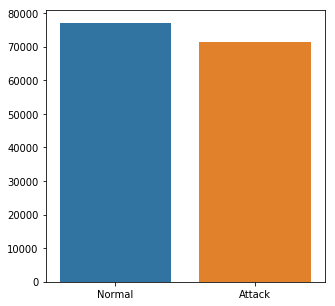

In [40]:
# Comapring the number of classes present in the dataset
rcParams['figure.figsize'] = 5,5
y = data['attack'].value_counts()
sb.barplot(y.index, y.values)

## Inference

### The classes present in the dataset are almost equally balanced.

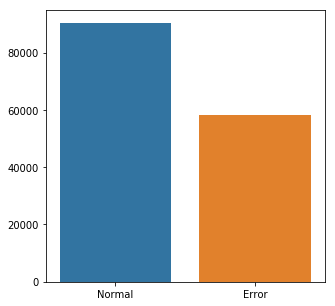

In [41]:
# Comapring the number of classes for 'flag' variable.
rcParams['figure.figsize'] = 5,5
y1 = data['flag'].value_counts()
sb.barplot(y1.index, y1.values)

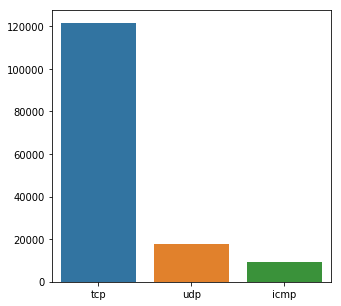

In [42]:
# Comapring the number of classes for 'protocol_type' variable.
rcParams['figure.figsize'] = 5,5
y2 = data['protocol_type'].value_counts()
sb.barplot(y2.index, y2.values)

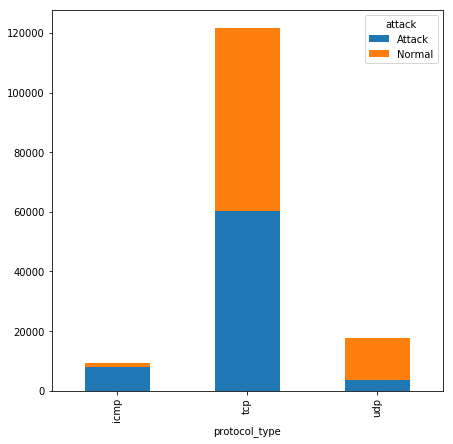

In [43]:
# Attack based on protocol_type
data.groupby(["protocol_type", "attack"]).size().unstack().plot(kind='bar', stacked=True, figsize=(7,7)) 

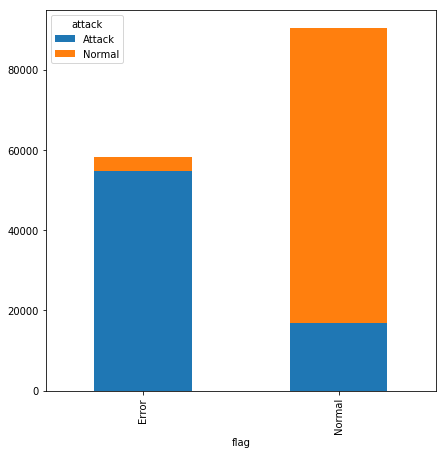

In [142]:
# Attack based on flag
data.groupby(["flag", "attack"]).size().unstack().plot(kind='bar', stacked=True, figsize=(7,7)) 

## Data Preparation

In [86]:
# Applying Dummy Encoding to feature 'protocol_type' and concatenating into original dataframe

prot_type = pd.get_dummies(data['protocol_type'],drop_first = True)

In [87]:
prot_type.head()

,tcp,udp
0,1,0
1,0,1
2,1,0
3,1,0
4,1,0


In [88]:
# Concatenating with original dataframe
data = pd.concat([data, prot_type], axis = 1)

In [89]:
# Dropping feature 'protocol_type'

data.drop(['protocol_type'],axis = 1,inplace = True)

In [90]:
data.head()

,duration,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,tcp,udp
0,0,ftp_data,Normal,491,0,0,0,0,0,0,...,0.03,0.17,0.00,0.00,0.00,0.05,0.00,Normal,1,0
1,0,other,Normal,146,0,0,0,0,0,0,...,0.60,0.88,0.00,0.00,0.00,0.00,0.00,Normal,0,1
2,0,private,Error,0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.00,1.00,0.00,0.00,Attack,1,0
3,0,http,Normal,232,8153,0,0,0,0,0,...,0.00,0.03,0.04,0.03,0.01,0.00,0.01,Normal,1,0
4,0,http,Normal,199,420,0,0,0,0,0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Normal,1,0


In [91]:
# Applying Dummy Encoding to feature 'flag' and concatenating into original dataframe

flag_type = pd.get_dummies(data['flag'],drop_first = True)

In [92]:
flag_type.head()

,Normal
0,1
1,1
2,0
3,1
4,1


In [93]:
# Concatenating with original dataframe
data = pd.concat([data, flag_type], axis = 1)

In [94]:
# Dropping feature 'flag'
data.drop(['flag'], axis = 1, inplace = True)

In [95]:
data.head()

,duration,service,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,...,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,tcp,udp,Normal
0,0,ftp_data,491,0,0,0,0,0,0,0,...,0.17,0.00,0.00,0.00,0.05,0.00,Normal,1,0,1
1,0,other,146,0,0,0,0,0,0,0,...,0.88,0.00,0.00,0.00,0.00,0.00,Normal,0,1,1
2,0,private,0,0,0,0,0,0,0,0,...,0.00,0.00,1.00,1.00,0.00,0.00,Attack,1,0,0
3,0,http,232,8153,0,0,0,0,0,1,...,0.03,0.04,0.03,0.01,0.00,0.01,Normal,1,0,1
4,0,http,199,420,0,0,0,0,0,1,...,0.00,0.00,0.00,0.00,0.00,0.00,Normal,1,0,1


In [96]:
# Applying Label Encoding to feature 'service'

le = LabelEncoder()

In [97]:
data.service = le.fit_transform(data.service)

In [98]:
data.head()

,duration,service,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,...,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,tcp,udp,Normal
0,0,20,491,0,0,0,0,0,0,0,...,0.17,0.00,0.00,0.00,0.05,0.00,Normal,1,0,1
1,0,44,146,0,0,0,0,0,0,0,...,0.88,0.00,0.00,0.00,0.00,0.00,Normal,0,1,1
2,0,49,0,0,0,0,0,0,0,0,...,0.00,0.00,1.00,1.00,0.00,0.00,Attack,1,0,0
3,0,24,232,8153,0,0,0,0,0,1,...,0.03,0.04,0.03,0.01,0.00,0.01,Normal,1,0,1
4,0,24,199,420,0,0,0,0,0,1,...,0.00,0.00,0.00,0.00,0.00,0.00,Normal,1,0,1


In [99]:
# Categorizing 'attack' variable into 0s and 1s

varlist2 =  ['attack']

# Defining the map function
def map_col2(x):
    return x.map({'Normal': 0,'Attack': 1})

In [100]:
data[varlist2] = data[varlist2].apply(map_col2)

In [101]:
data.head()

,duration,service,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,...,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,tcp,udp,Normal
0,0,20,491,0,0,0,0,0,0,0,...,0.17,0.00,0.00,0.00,0.05,0.00,0,1,0,1
1,0,44,146,0,0,0,0,0,0,0,...,0.88,0.00,0.00,0.00,0.00,0.00,0,0,1,1
2,0,49,0,0,0,0,0,0,0,0,...,0.00,0.00,1.00,1.00,0.00,0.00,1,1,0,0
3,0,24,232,8153,0,0,0,0,0,1,...,0.03,0.04,0.03,0.01,0.00,0.01,0,1,0,1
4,0,24,199,420,0,0,0,0,0,1,...,0.00,0.00,0.00,0.00,0.00,0.00,0,1,0,1


In [102]:
# Checking the Attack Rate
attack = (sum(data['attack'])/len(data['attack'].index))*100
print(attack)

48.11772389692762


In [107]:
data1 = data.corr()

In [109]:
#Function to print all features in data1
def printall(data1, max_rows = 100):
    display(HTML(data1.to_html(max_rows = max_rows)))
printall(data1)

,duration,service,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,tcp,udp,Normal
duration,1.000000,0.097319,0.068959,0.034056,-0.001651,-0.009616,0.002426,0.000664,0.000525,-0.064474,0.043998,0.046792,0.087257,0.046908,0.083243,-0.000996,0.067388,NaN,-0.000824,-0.000260,-0.078091,-0.039094,-0.064628,-0.064626,0.164661,0.165058,0.074720,-0.017784,-0.039485,0.050311,-0.098013,-0.104631,0.223635,0.201276,-0.025950,-0.053810,-0.052306,0.143896,0.163306,0.052119,0.000918,0.020771,-0.058176
service,0.097319,1.000000,-0.002055,0.003173,-0.011187,0.076063,0.015840,-0.065115,0.072406,-0.163259,0.019022,0.038076,0.039913,0.019446,0.032580,0.012314,0.028001,NaN,-0.001367,-0.086747,0.107581,-0.233105,0.251194,0.248708,0.176679,0.174077,-0.362576,0.213620,-0.075738,0.207738,-0.395161,-0.444806,0.274431,-0.116957,-0.161065,0.257416,0.256548,0.185974,0.180174,0.299911,0.220971,-0.099386,-0.343708
src_bytes,0.068959,-0.002055,1.000000,0.000212,-0.000109,-0.000633,-0.000074,0.000347,-0.000443,-0.003286,-0.000079,-0.000274,-0.000166,-0.000087,-0.000151,-0.000130,-0.000302,NaN,-0.000067,-0.000817,-0.004796,-0.002609,-0.002785,-0.002990,0.011591,0.011812,0.003634,-0.000637,-0.002500,-0.005586,-0.006663,-0.006312,0.000730,0.000559,-0.001424,-0.004003,-0.002959,-0.001746,0.010494,0.005457,0.003483,-0.002723,-0.005626
dst_bytes,0.034056,0.003173,0.000212,1.000000,-0.000068,-0.000394,0.000179,-0.000297,0.000096,-0.002635,0.001253,0.000971,0.001155,0.001250,0.000086,-0.000061,0.000353,NaN,-0.000038,-0.000461,-0.003226,-0.001611,-0.002665,-0.002649,0.009446,0.009377,0.003450,-0.001588,-0.001553,0.002225,-0.003977,-0.004168,0.009834,0.010847,-0.001143,-0.002639,-0.002567,0.009986,0.009599,0.003583,0.002167,-0.001686,-0.004171
land,-0.001651,-0.011187,-0.000109,-0.000068,1.000000,-0.001255,-0.000153,-0.001381,-0.000878,-0.012056,-0.000168,-0.000571,-0.000338,-0.000177,-0.000342,-0.000278,-0.000618,NaN,-0.000132,-0.001639,-0.010042,-0.005144,0.024544,0.025271,-0.005061,-0.005948,0.009253,-0.002565,0.040548,-0.024564,-0.015214,0.009425,-0.004612,0.032151,0.072119,0.020496,0.015019,-0.005983,-0.005972,0.008817,0.006912,-0.005385,-0.018296
wrong_fragment,-0.009616,0.076063,-0.000633,-0.000394,-0.001255,1.000000,-0.000889,-0.008042,-0.005115,-0.070207,-0.000981,-0.003323,-0.001969,-0.001031,-0.001993,-0.001621,-0.003601,NaN,-0.000768,-0.009543,-0.019921,0.021143,-0.038162,-0.050461,-0.034368,-0.034639,0.051176,-0.025896,-0.022829,0.032552,-0.046659,-0.046590,0.051988,0.040057,-0.009777,-0.045495,-0.049994,0.019283,-0.034778,0.081696,-0.181573,0.211450,0.068595
urgent,0.002426,0.015840,-0.000074,0.000179,-0.000153,-0.000889,1.000000,0.008151,0.037775,0.011253,0.029034,0.178312,0.065206,0.031588,0.023194,0.037359,0.028685,NaN,-0.000094,-0.001161,-0.007336,-0.003762,-0.006188,-0.006141,-0.004228,-0.004215,0.007793,-0.003621,-0.003916,-0.011494,-0.009655,-0.003882,0.007248,0.002249,0.005386,-0.005676,-0.006068,-0.003789,-0.001098,0.003862,0.004898,-0.003816,0.008347
hot,0.000664,-0.065115,0.000347,-0.000297,-0.001381,-0.008042,0.008151,1.000000,0.000297,0.113230,0.002582,0.025475,0.000437,0.002083,0.090855,0.009083,0.000777,NaN,0.006596,0.720317,-0.066004,-0.033403,-0.054440,-0.054144,-0.034769,-0.033947,0.066636,-0.017705,-0.026141,-0.012182,-0.051125,-0.036210,-0.009751,-0.033311,-0.022945,-0.053126,-0.053734,-0.031549,-0.034212,-0.009637,0.044290,-0.034507,0.072981
num_failed_logins,0.000525,0.072406,-0.000443,0.000096,-0.000878,-0.005115,0.0

In [110]:
# Dropping feature 'num_outbound_cmds' as it has no significant correlation with other features

data.drop(['num_outbound_cmds'],axis = 1,inplace = True)

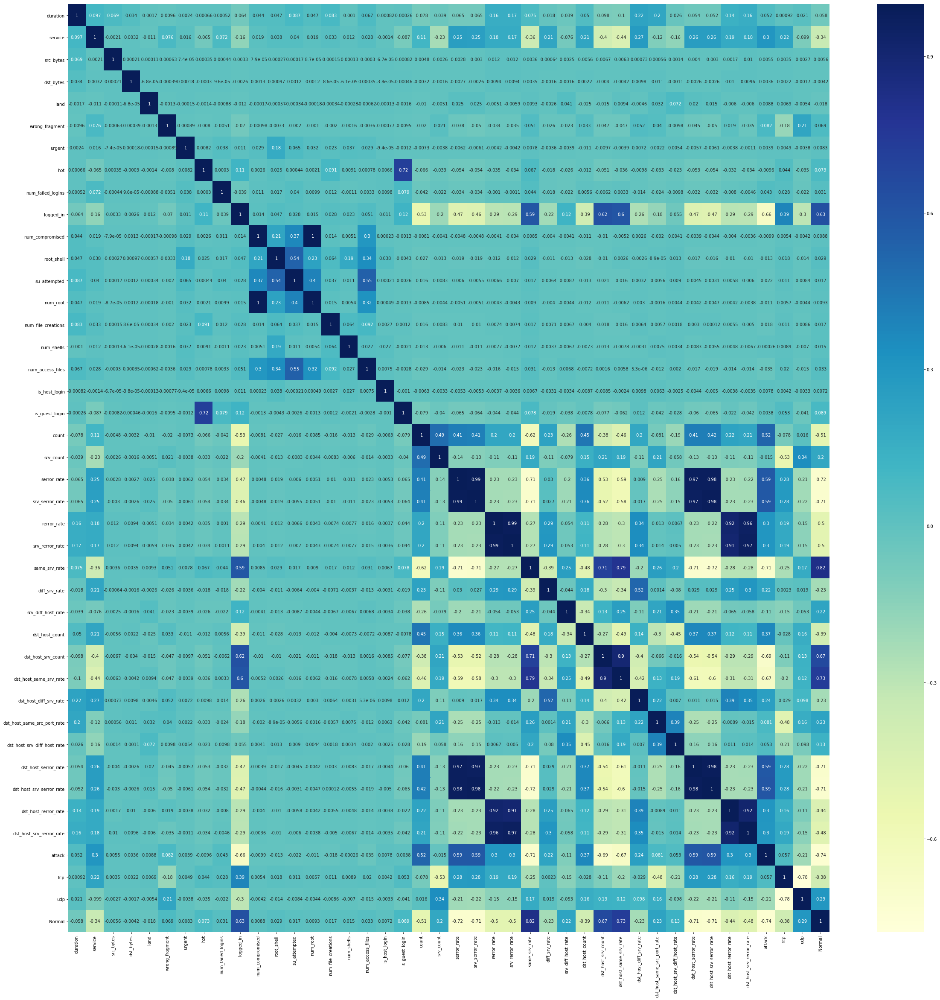

In [111]:
# Correlation matrix using heatmap before scaling
plt.figure(figsize = (40, 40))
sb.heatmap(data.corr(), annot = True, cmap="YlGnBu")
plt.show()

## Splitting the data into train and test set

In [112]:
# Selecting the list of predictors and target variables

X = data.drop(['attack'], axis = 1)
y = data['attack']

In [113]:
X.head()

,duration,service,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,tcp,udp,Normal
0,0,20,491,0,0,0,0,0,0,0,...,0.03,0.17,0.00,0.00,0.00,0.05,0.00,1,0,1
1,0,44,146,0,0,0,0,0,0,0,...,0.60,0.88,0.00,0.00,0.00,0.00,0.00,0,1,1
2,0,49,0,0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.00,1.00,0.00,0.00,1,0,0
3,0,24,232,8153,0,0,0,0,0,1,...,0.00,0.03,0.04,0.03,0.01,0.00,0.01,1,0,1
4,0,24,199,420,0,0,0,0,0,1,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1,0,1


In [114]:
y.head()

0    0
1    0
2    1
3    0
4    0
Name: attack, dtype: int64

In [121]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [122]:
X_train.head()

,duration,service,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,tcp,udp,Normal
3848,0,24,280,12913,0,0,0,0,0,1,...,0.00,0.03,0.07,0.0,0.00,0.0,0.0,1,0,1
63237,0,20,12,0,0,0,0,0,0,1,...,0.08,0.35,0.01,0.0,0.01,0.0,0.0,1,0,1
82734,0,24,0,0,0,0,0,0,0,0,...,0.00,0.11,0.26,0.0,0.00,1.0,1.0,1,0,0
114184,0,19,0,0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.0,1.00,0.0,0.0,1,0,0
63773,0,60,0,0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.0,1.00,0.0,0.0,1,0,0


In [124]:
X_train.shape

(103961, 41)

In [123]:
y_train.head()

3848      0
63237     0
82734     0
114184    1
63773     1
Name: attack, dtype: int64

In [126]:
X_test.shape

(44556, 41)

## Feature scaling

In [127]:
scaler = StandardScaler()

In [131]:
X_train[['duration','src_bytes','dst_bytes','wrong_fragment','urgent','hot','num_failed_logins','num_compromised','num_root','num_file_creations','num_shells','num_access_files','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate']] = scaler.fit_transform(X_train[['duration','src_bytes','dst_bytes','wrong_fragment','urgent','hot','num_failed_logins','num_compromised','num_root','num_file_creations','num_shells','num_access_files','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate']])

In [132]:
X_train.describe()

,duration,service,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,tcp,udp,Normal
count,1.039610e+05,103961.000000,1.039610e+05,1.039610e+05,103961.000000,1.039610e+05,1.039610e+05,1.039610e+05,1.039610e+05,103961.000000,...,1.039610e+05,1.039610e+05,1.039610e+05,1.039610e+05,1.039610e+05,1.039610e+05,1.039610e+05,103961.000000,103961.000000,103961.000000
mean,6.941361e-16,31.703812,-6.590002e-16,2.879497e-16,0.000240,-1.285642e-15,-1.497258e-15,2.070036e-15,-2.770224e-15,0.403401,...,-4.570506e-16,2.263797e-15,1.799418e-16,7.493186e-16,-8.094597e-16,4.970325e-17,2.908760e-16,0.818009,0.119054,0.609613
std,1.000005e+00,16.286077,1.000005e+00,1.000005e+00,0.015505,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,0.490582,...,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,0.385839,0.323854,0.487839
min,-1.109638e-01,0.000000,-7.262226e-03,-5.306257e-03,0.000000,-8.470501e-02,-9.808118e-03,-9.350373e-02,-6.134201e-02,0.000000,...,-4.327471e-01,-4.728111e-01,-2.808240e-01,-5.979834e-01,-5.848992e-01,-4.198302e-01,-4.044378e-01,0.000000,0.000000,0.000000
25%,-1.109638e-01,20.000000,-7.262226e-03,-5.306257e-03,0.000000,-8.470501e-02,-9.808118e-03,-9.350373e-02,-6.134201e-02,0.000000,...,-4.327471e-01,-4.728111e-01,-2.808240e-01,-5.979834e-01,-5.848992e-01,-4.198302e-01,-4.044378e-01,1.000000,0.000000,0.000000
50%,-1.109638e-01,24.000000,-7.253248e-03,-5.306257e-03,0.000000,-8.470501e-02,-9.808118e-03,-9.350373e-02,-6.134201e-02,0.000000,...,-3.292691e-01,-4.728111e-01,-2.808240e-01,-5.979834e-01,-5.848992e-01,-4.198302e-01,-4.044378e-01,1.000000,0.000000,1.000000
75%,-1.109638e-01,49.000000,-7.205504e-03,-4.846950e-03,0.000000,-8.470501e-02,-9.808118e-03,-9.350373e-02,-6.134201e-02,1.000000,...,-7.057408e-02,-3.107393e-01,-1.884090e-01,8.020465e-01,6.016812e-01,-4.198302e-01,-4.044378e-01,1.000000,0.000000,1.000000
max,2.353591e+01,69.000000,2.815549e+02,3.219849e+02,1.000000,1.253739e+01,1.529394e+02,5.037401e+01,6.807089e+01,1.000000,...,4.741153e+00,2.768625e+00,8.960681e+00,1.735400e+00,1.741729e+00,2.693023e+00,2.590612e+00,1.000000,1.000000,1.000000


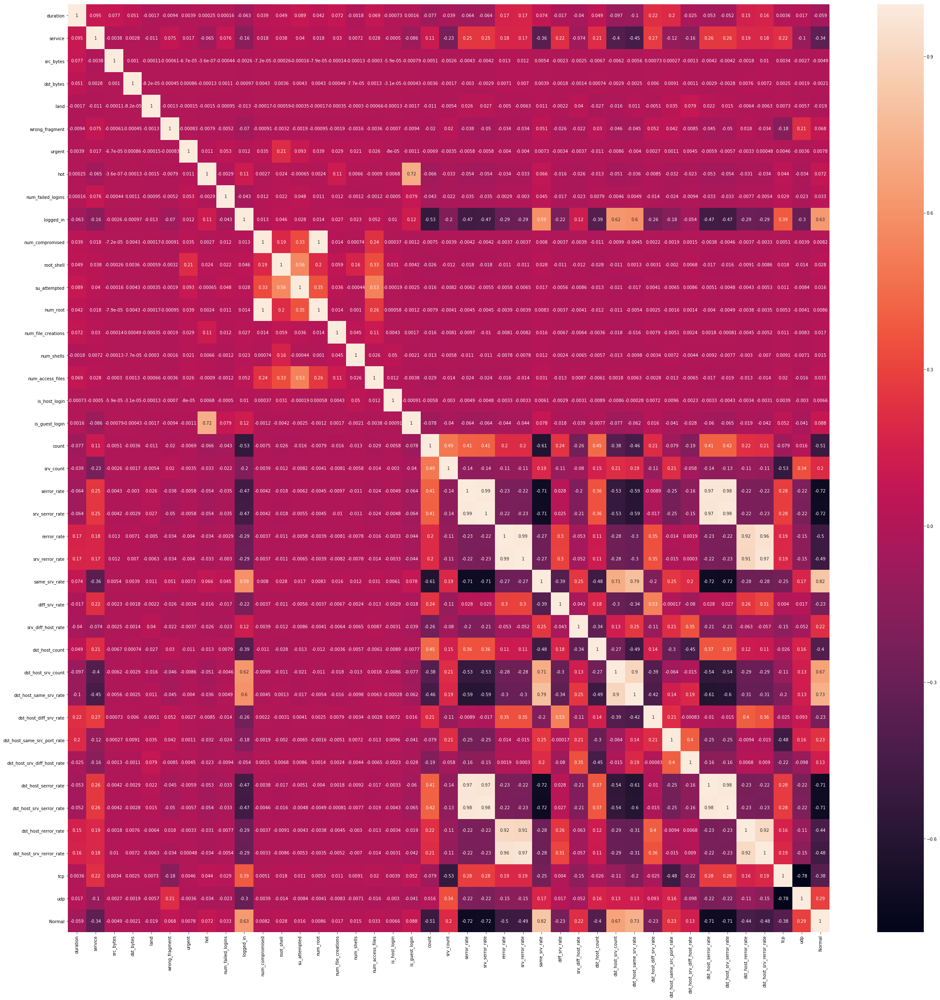

In [134]:
plt.figure(figsize = (40,40))
sb.heatmap(X_train.corr(),annot = True)
plt.show()

## Model Building using Recursive feature selection

In [140]:
# Logistic regression model
logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 attack   No. Observations:               103961
Model:                            GLM   Df Residuals:                   103919
Model Family:                Binomial   Df Model:                           41
Link Function:                  logit   Scale:                             1.0
Method:                          IRLS   Log-Likelihood:                    nan
Date:                Sun, 03 Mar 2019   Deviance:                   1.0227e+07
Time:                        18:02:03   Pearson chi2:                 5.00e+19
No. Iterations:                   100                                         
===============================================================================================
                                  coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                         3.86e+14   2.38e+06   1.62e+08      0.000    3.86e+14    3.86e+14
duration                    -2.934e+13   2.34e+05  -1.26e+08      0.000   -2.93e+13   -2.93e+13
service                      7.462e+12   1.52e+04   4.91e+08      0.000    7.46e+12    7.46e+12
src_bytes                    1.029e+14   2.09e+05   4.93e+08      0.000    1.03e+14    1.03e+14
dst_bytes                    2.016e+13   2.08e+05   9.67e+07      0.000    2.02e+13    2.02e+13
land                         8.542e+13   1.36e+07    6.3e+06      0.000    8.54e+13    8.54e+13
wrong_fragment               5.122e+13   2.21e+05   2.32e+08      0.000    5.12e+13    5.12e+13
urgent                       3.626e+13   2.14e+05    1.7e+08      0.000    3.63e+13    3.63e+13
hot                         -5.487e+13   3.06e+05  -1.79e+08      0.000   -5.49e+13   -5.49e+13
num_failed_logins            6.529e+13   2.21e+05   2.96e+08      0.000    6.53e+13    6.53e+13
logged_in                    8.329e+13   1.28e+06   6.51e+07      0.000    8.33e+13    8.33e+13
num_compromised              4.988e+15   7.29e+06   6.84e+08      0.000    4.99e+15    4.99e+15
root_shell                   7.017e+14   6.88e+06   1.02e+08      0.000    7.02e+14    7.02e+14
su_attempted                -2.811e+15   7.79e+06  -3.61e+08      0.000   -2.81e+15   -2.81e+15
num_root                    -5.057e+15   7.37e+06  -6.86e+08      0.000   -5.06e+15   -5.06e+15
num_file_creations          -1.817e+13   2.15e+05  -8.46e+07      0.000   -1.82e+13   -1.82e+13
num_shells                   5.225e+12   2.13e+05   2.45e+07      0.000    5.22e+12    5.22e+12
num_access_files             -2.96e+13   2.71e+05  -1.09e+08      0.000   -2.96e+13   -2.96e+13
is_host_login                2.263e+15   2.54e+07    8.9e+07      0.000    2.26e+15    2.26e+15
is_guest_login              -5.155e+13   2.85e+06  -1.81e+07      0.000   -5.15e+13   -5.15e+13
count                        5.298e+14   4.72e+05   1.12e+09      0.000     5.3e+14     5.3e+14
srv_count                   -3.943e+14   4.26e+05  -9.25e+08      0.000   -3.94e+14   -3.94e+14
serror_rate                 -4.263e+14   2.06e+06  -2.07e+08      0.000   -4.26e+14   -4.26e+14
srv_serror_rate              8.795e+14   2.22e+06   3.97e+08      0.000     8.8e+14     8.8e+14
rerror_rate                 -4.632e+14   1.59e+06  -2.91e+08      0.000   -4.63e+14   -4.63e+14
srv_rerror_rate              5.363e+14    1.7e+06   3.15e+08      0.000    5.36e+14    5.36e+14
same_srv_rate               -3.722e+14   6.94e+05  -5.36e+08      0.000   -3.72e+14   -3.72e+14
diff_srv_rate               -1.539e+13   3.08e+05  -4.99e+07      0.000   -1.54e+13   -1.54e+13
srv_diff_host_rate           1.266e+14   2.41e+05   5.25e+08      0.000    1.27e+14    1.27e+14
dst_host_count               4.975e+14    3.1e+05    1.6e+09      0.000    4.98e+14    4.9

In [141]:
logreg = LogisticRegression()

In [142]:
# Running RFE with 13 variables as output
rfe = RFE(logreg, 13)             
rfe = rfe.fit(X_train, y_train)

In [143]:
rfe.support_

array([False, False, False, False,  True, False, False, False, False,
       False,  True,  True,  True,  True, False, False, False,  True,
        True,  True,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False,  True,  True,  True])

In [144]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('duration', False, 27),
 ('service', False, 26),
 ('src_bytes', False, 10),
 ('dst_bytes', False, 29),
 ('land', True, 1),
 ('wrong_fragment', False, 9),
 ('urgent', False, 22),
 ('hot', False, 24),
 ('num_failed_logins', False, 16),
 ('logged_in', False, 3),
 ('num_compromised', True, 1),
 ('root_shell', True, 1),
 ('su_attempted', True, 1),
 ('num_root', True, 1),
 ('num_file_creations', False, 21),
 ('num_shells', False, 28),
 ('num_access_files', False, 23),
 ('is_host_login', True, 1),
 ('is_guest_login', True, 1),
 ('count', True, 1),
 ('srv_count', True, 1),
 ('serror_rate', False, 11),
 ('srv_serror_rate', False, 8),
 ('rerror_rate', False, 25),
 ('srv_rerror_rate', False, 13),
 ('same_srv_rate', False, 12),
 ('diff_srv_rate', False, 20),
 ('srv_diff_host_rate', False, 18),
 ('dst_host_count', False, 5),
 ('dst_host_srv_count', False, 2),
 ('dst_host_same_srv_rate', False, 4),
 ('dst_host_diff_srv_rate', False, 17),
 ('dst_host_same_src_port_rate', False, 6),
 ('dst_host_srv_

In [145]:
col = X_train.columns[rfe.support_]

In [146]:
X_train.columns[~rfe.support_]

Index(['duration', 'service', 'src_bytes', 'dst_bytes', 'wrong_fragment',
       'urgent', 'hot', 'num_failed_logins', 'logged_in', 'num_file_creations',
       'num_shells', 'num_access_files', 'serror_rate', 'srv_serror_rate',
       'rerror_rate', 'srv_rerror_rate', 'same_srv_rate', 'diff_srv_rate',
       'srv_diff_host_rate', 'dst_host_count', 'dst_host_srv_count',
       'dst_host_same_srv_rate', 'dst_host_diff_srv_rate',
       'dst_host_same_src_port_rate', 'dst_host_srv_diff_host_rate',
       'dst_host_serror_rate', 'dst_host_rerror_rate',
       'dst_host_srv_rerror_rate'],
      dtype='object')

In [147]:
X_train_sm = sm.add_constant(X_train[col])

In [148]:
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())

In [149]:
res = logm2.fit()

In [150]:
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 attack   No. Observations:               103961
Model:                            GLM   Df Residuals:                   103947
Model Family:                Binomial   Df Model:                           13
Link Function:                  logit   Scale:                             1.0
Method:                          IRLS   Log-Likelihood:                -24239.
Date:                Sun, 03 Mar 2019   Deviance:                       48479.
Time:                        23:19:34   Pearson chi2:                 4.50e+15
No. Iterations:                    25                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                        7.7540      0.068    114.756      0.000       7.622       7.886
land                        -1.3207      0.574     -2.302      0.021      -2.445      -0.196
num_compromised             32.2799      1.660     19.450      0.000      29.027      35.533
root_shell                   1.7208      0.270      6.377      0.000       1.192       2.250
su_attempted               -28.8224   1.44e+04     -0.002      0.998   -2.82e+04    2.82e+04
num_root                   -32.7577      1.684    -19.450      0.000     -36.059     -29.457
is_host_login                5.8816      1.665      3.532      0.000       2.618       9.145
is_guest_login               2.6805      0.060     44.948      0.000       2.564       2.797
count                        3.2870      0.073     45.205      0.000       3.145       3.430
srv_count                   -2.1764      0.048    -44.900      0.000      -2.271      -2.081
dst_host_srv_serror_rate     1.6775      0.048     34.975      0.000       1.584       1.772
tcp                         -4.8176      0.045   -106.801      0.000      -4.906      -4.729
udp                         -3.4924      0.045    -78.113      0.000      -3.580      -3.405
Normal                      -3.0896      0.033    -95.063      0.000      -3.153      -3.026
============================================================================================
"""

In [152]:
# Dropping feature 'su_attempted'n due to its high  p-value(Assuming 5% as threshold)

col = col.drop('su_attempted', 1)
col

Index(['land', 'num_compromised', 'root_shell', 'num_root', 'is_host_login',
       'is_guest_login', 'count', 'srv_count', 'dst_host_srv_serror_rate',
       'tcp', 'udp', 'Normal'],
      dtype='object')

In [153]:
# Re-running the model

X_train_sm = sm.add_constant(X_train[col])

In [154]:
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())

In [155]:
res = logm3.fit()

In [156]:
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 attack   No. Observations:               103961
Model:                            GLM   Df Residuals:                   103948
Model Family:                Binomial   Df Model:                           12
Link Function:                  logit   Scale:                             1.0
Method:                          IRLS   Log-Likelihood:                -24274.
Date:                Sun, 03 Mar 2019   Deviance:                       48548.
Time:                        23:43:59   Pearson chi2:                 4.50e+15
No. Iterations:                    12                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                        7.7447      0.067    114.857      0.000       7.613       7.877
land                        -1.3114      0.572     -2.291      0.022      -2.433      -0.190
num_compromised             29.6520      1.590     18.649      0.000      26.536      32.768
root_shell                   1.3661      0.269      5.081      0.000       0.839       1.893
num_root                   -30.1018      1.616    -18.632      0.000     -33.268     -26.935
is_host_login                5.8062      1.618      3.589      0.000       2.636       8.977
is_guest_login               2.6747      0.060     44.869      0.000       2.558       2.792
count                        3.2876      0.073     45.208      0.000       3.145       3.430
srv_count                   -2.1768      0.048    -44.904      0.000      -2.272      -2.082
dst_host_srv_serror_rate     1.6660      0.048     35.057      0.000       1.573       1.759
tcp                         -4.8119      0.045   -106.746      0.000      -4.900      -4.724
udp                         -3.4925      0.045    -78.113      0.000      -3.580      -3.405
Normal                      -3.0849      0.032    -95.051      0.000      -3.148      -3.021
============================================================================================
"""

In [157]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

3848      0.065107
63237     0.069338
82734     0.610607
114184    0.999989
63773     0.999995
133574    0.172690
29660     0.999172
43576     0.107027
104527    0.186634
93967     0.898158
dtype: float64

In [158]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.06510672, 0.06933774, 0.61060736, 0.99998879, 0.99999476,
       0.17269001, 0.99917152, 0.10702742, 0.18663382, 0.89815766])

In [160]:
# Creating a separate dataframe to store original and predicted probabilities.
y_train_pred_final = pd.DataFrame({'attack':y_train.values, 'attack_Prob':y_train_pred})

In [163]:
y_train_pred_final.head(50)

,attack,attack_Prob
0,0,0.065107
1,0,0.069338
2,0,0.610607
3,1,0.999989
4,1,0.999995
5,0,0.172690
6,1,0.999172
7,0,0.107027
8,0,0.186634
9,1,0.898158


### Creating new column 'attack_predicted' with 1 if attack_Prob > 0.3 else 0

In [164]:
y_train_pred_final['attack_predicted'] = y_train_pred_final.attack_Prob.map(lambda x: 1 if x > 0.3 else 0)

In [165]:
y_train_pred_final.head()

,attack,attack_Prob,attack_predicted
0,0,0.065107,0
1,0,0.069338,0
2,0,0.610607,1
3,1,0.999989,1
4,1,0.999995,1


In [166]:
#Accuracy score(For training data)
accuracy_score(y_train_pred_final.attack, y_train_pred_final.attack_predicted)

0.9112936581987476

In [169]:
#Confusion Matrix(For training data)
Conf_Matrix_LOR = confusion_matrix(y_train_pred_final.attack, y_train_pred_final.attack_predicted)
print(Conf_Matrix_LOR)

[[49546  4502]
 [ 4720 45193]]


## Checking for Multi-Collinearity using Variation inflation factor

In [173]:
# Creating a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,num_root,682.72
1,num_compromised,678.67
11,Normal,5.66
9,tcp,3.84
6,count,2.57
7,srv_count,2.42
8,dst_host_srv_serror_rate,1.97
10,udp,1.64
2,root_shell,1.20
5,is_guest_login,1.03


In [174]:
# Dropping feature 'num_root' due to its high VIF value

col = col.drop('num_root', 1)
col

Index(['land', 'num_compromised', 'root_shell', 'is_host_login',
       'is_guest_login', 'count', 'srv_count', 'dst_host_srv_serror_rate',
       'tcp', 'udp', 'Normal'],
      dtype='object')

In [175]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])

In [176]:
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())

In [177]:
res = logm3.fit()

In [178]:
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                 attack   No. Observations:               103961
Model:                            GLM   Df Residuals:                   103949
Model Family:                Binomial   Df Model:                           11
Link Function:                  logit   Scale:                             1.0
Method:                          IRLS   Log-Likelihood:                -24565.
Date:                Mon, 04 Mar 2019   Deviance:                       49130.
Time:                        00:24:48   Pearson chi2:                 1.65e+07
No. Iterations:                     9                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
const                        7.7288      0.067    114.553      0.000       7.597       7.861
land                        -1.3409      0.576     -2.329      0.020      -2.469      -0.212
num_compromised             -0.2085      0.061     -3.401      0.001      -0.329      -0.088
root_shell                   1.7973      0.214      8.388      0.000       1.377       2.217
is_host_login                4.1458      1.092      3.797      0.000       2.006       6.286
is_guest_login               2.6172      0.059     44.052      0.000       2.501       2.734
count                        3.2893      0.073     45.199      0.000       3.147       3.432
srv_count                   -2.1792      0.049    -44.922      0.000      -2.274      -2.084
dst_host_srv_serror_rate     1.6971      0.047     35.856      0.000       1.604       1.790
tcp                         -4.7579      0.045   -106.081      0.000      -4.846      -4.670
udp                         -3.4937      0.045    -78.113      0.000      -3.581      -3.406
Normal                      -3.0296      0.032    -94.409      0.000      -3.092      -2.967
============================================================================================
"""

In [179]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)

In [180]:
y_train_pred[:10]

array([0.06863531, 0.07312893, 0.61092266, 0.99998962, 0.99999515,
       0.17193869, 0.99923124, 0.10706762, 0.18610251, 0.89839155])

In [181]:
# Creating a separate dataframe to store original and predicted probabilities.
y_train_pred_final = pd.DataFrame({'attack':y_train.values, 'attack_Prob':y_train_pred})

In [183]:
y_train_pred_final.head(50)

,attack,attack_Prob
0,0,0.068635
1,0,0.073129
2,0,0.610923
3,1,0.999990
4,1,0.999995
5,0,0.171939
6,1,0.999231
7,0,0.107068
8,0,0.186103
9,1,0.898392


In [184]:
y_train_pred_final['attack_predicted'] = y_train_pred_final.attack_Prob.map(lambda x: 1 if x > 0.3 else 0)

In [185]:
y_train_pred_final.head()

,attack,attack_Prob,attack_predicted
0,0,0.068635,0
1,0,0.073129,0
2,0,0.610923,1
3,1,0.999990,1
4,1,0.999995,1


In [186]:
#Accuracy score(For training data)
accuracy_score(y_train_pred_final.attack, y_train_pred_final.attack_predicted)

0.9120343205625187

In [187]:
#Confusion Matrix(For training data)
Conf_Matrix_LOR = confusion_matrix(y_train_pred_final.attack, y_train_pred_final.attack_predicted)
print(Conf_Matrix_LOR)

[[49596  4452]
 [ 4693 45220]]


## Checking for VIF values once again

In [188]:
# Creating a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
10,Normal,5.66
8,tcp,3.83
5,count,2.57
6,srv_count,2.42
7,dst_host_srv_serror_rate,1.97
9,udp,1.64
1,num_compromised,1.04
2,root_shell,1.04
4,is_guest_login,1.03
0,land,1.00


## Inference 

### All VIF values are within range

## Plotting ROC curve for training data

An ROC curve demonstrates several things:

- It shows the tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by a decrease in specificity).
- The closer the curve follows the left-hand border and then the top border of the ROC space, the more accurate the test.
- The closer the curve comes to the 45-degree diagonal of the ROC space, the less accurate the test.

In [196]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic curve')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [197]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.attack, y_train_pred_final.attack_Prob, drop_intermediate = False )

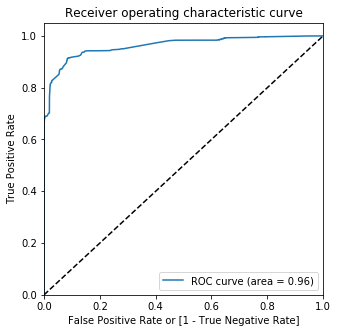

In [198]:
draw_roc(y_train_pred_final.attack, y_train_pred_final.attack_Prob)

## Finding optimal cut-off point

In [199]:
# Creating columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.attack_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,attack,attack_Prob,attack_predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.068635,0,1,0,0,0,0,0,0,0,0,0
1,0,0.073129,0,1,0,0,0,0,0,0,0,0,0
2,0,0.610923,1,1,1,1,1,1,1,1,0,0,0
3,1,0.999990,1,1,1,1,1,1,1,1,1,1,1
4,1,0.999995,1,1,1,1,1,1,1,1,1,1,1


In [200]:
# Calculating Accuracy,Sensitivity and Specificity for various probability cutoffs.

cutoff_df = pd.DataFrame(columns = ['prob','accuracy','sensi','speci'])

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.attack, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.480113  1.000000  0.000000
0.1   0.1  0.852358  0.943201  0.768465
0.2   0.2  0.892921  0.942540  0.847099
0.3   0.3  0.912034  0.905976  0.917629
0.4   0.4  0.909389  0.898223  0.919701
0.5   0.5  0.908158  0.894476  0.920793
0.6   0.6  0.906109  0.873720  0.936020
0.7   0.7  0.897231  0.809388  0.978353
0.8   0.8  0.886679  0.785928  0.979722
0.9   0.9  0.845750  0.690281  0.989324


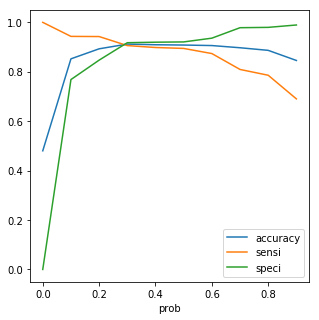

In [201]:
# Plotting Accuracy,Sensitivity and Specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

#### From the curve above, 0.3 is the optimum point to take it as a cutoff probability.

In [202]:
y_train_pred_final['final_predicted'] = y_train_pred_final.attack_Prob.map(lambda x: 1 if x > 0.3 else 0)

y_train_pred_final.head()

,attack,attack_Prob,attack_predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.068635,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.073129,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.610923,1,1,1,1,1,1,1,1,0,0,0,1
3,1,0.999990,1,1,1,1,1,1,1,1,1,1,1,1
4,1,0.999995,1,1,1,1,1,1,1,1,1,1,1,1


In [204]:
# Overall accuracy
accuracy_score(y_train_pred_final.attack, y_train_pred_final.final_predicted)

0.9120343205625187

In [205]:
Conf_Matrix_LOR = confusion_matrix(y_train_pred_final.attack, y_train_pred_final.final_predicted )
print(Conf_Matrix_LOR)

[[49596  4452]
 [ 4693 45220]]


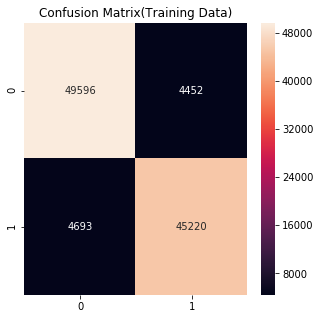

In [216]:
#Heatmap for Confusion matrix(Logistic Regression)
sb.heatmap(Conf_Matrix_LOR, annot=True,  fmt='');
title = 'Confusion Matrix(Training Data)'
plt.title(title);
rcParams['figure.figsize'] = 5,5

## Calculating other metrics for training data

In [207]:
TP = Conf_Matrix_LOR[1,1]  # true positive 
TN = Conf_Matrix_LOR[0,0] # true negatives
FP = Conf_Matrix_LOR[0,1] # false positives
FN = Conf_Matrix_LOR[1,0] # false negatives

In [208]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.9059763989341454

In [209]:
# Let us calculate specificity
TN / float(TN+FP)

0.9176287744227354

In [210]:
# Calculate false postive rate 
print(FP/ float(TN+FP))

0.08237122557726466


In [211]:
# Positive predictive value 
print (TP / float(TP+FP))

0.9103720405862458


In [212]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9135552321833152


## Precision and Recall Score for training data

In [214]:
# Precision score
Conf_Matrix_LOR[1,1]/(Conf_Matrix_LOR[0,1]+Conf_Matrix_LOR[1,1])

0.9103720405862458

In [215]:
# Recall score
Conf_Matrix_LOR[1,1]/(Conf_Matrix_LOR[1,0]+Conf_Matrix_LOR[1,1])

0.9059763989341454

## Predictions on test data

In [217]:
# Scaling the features

scaler = StandardScaler()

In [218]:
X_test[['duration','src_bytes','dst_bytes','wrong_fragment','urgent','hot','num_failed_logins','num_compromised','num_root','num_file_creations','num_shells','num_access_files','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate']] = scaler.fit_transform(X_test[['duration','src_bytes','dst_bytes','wrong_fragment','urgent','hot','num_failed_logins','num_compromised','num_root','num_file_creations','num_shells','num_access_files','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate']])

In [219]:
X_test = X_test[col]
X_test.head()

,land,num_compromised,root_shell,is_host_login,is_guest_login,count,srv_count,dst_host_srv_serror_rate,tcp,udp,Normal
107361,0,-0.019813,0,0,0,-0.706683,-0.361399,-0.584611,1,0,0
101250,0,-0.019813,0,0,0,-0.663570,-0.294253,-0.584611,1,0,1
39280,0,-0.019813,0,0,0,-0.706683,0.081764,-0.584611,0,0,1
35668,0,-0.019813,0,0,0,-0.698060,-0.347970,-0.584611,1,0,0
2718,0,-0.019813,0,0,0,-0.706683,-0.347970,-0.584611,0,1,1


In [220]:
# Adding a constant
X_test_sm = sm.add_constant(X_test)

In [221]:
# Predictions
y_test_pred = res.predict(X_test_sm)

In [222]:
y_test_pred[:10]

107361    0.609678
101250    0.069905
39280     0.770034
35668     0.609463
2718      0.206080
21822     0.672970
28246     0.051747
39505     0.999604
79244     0.070140
14048     0.996465
dtype: float64

In [223]:
# Converting y_test_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

In [224]:
# Let's see the head
y_pred_1.head()

,0
107361,0.609678
101250,0.069905
39280,0.770034
35668,0.609463
2718,0.206080


In [225]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [226]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [229]:
# Appending y_test_df and y_pred_1
y_test_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [230]:
y_test_pred_final.head()

,attack,0
0,1,0.609678
1,0,0.069905
2,1,0.770034
3,1,0.609463
4,0,0.206080


In [231]:
# Renaming the column 
y_test_pred_final= y_test_pred_final.rename(columns={ 0 : 'attack_Prob'})

In [233]:
y_test_pred_final.head(25)

,attack,attack_Prob
0,1,0.609678
1,0,0.069905
2,1,0.770034
3,1,0.609463
4,0,0.206080
5,1,0.672970
6,0,0.051747
7,1,0.999604
8,0,0.070140
9,1,0.996465


In [234]:
# Considering 0.3 as optimum cut off point
y_test_pred_final['final_predicted'] = y_test_pred_final.attack_Prob.map(lambda x: 1 if x > 0.3 else 0)

In [235]:
y_test_pred_final.head(25)

,attack,attack_Prob,final_predicted
0,1,0.609678,1
1,0,0.069905,0
2,1,0.770034,1
3,1,0.609463,1
4,0,0.206080,0
5,1,0.672970,1
6,0,0.051747,0
7,1,0.999604,1
8,0,0.070140,0
9,1,0.996465,1


In [236]:
# Let's check the overall accuracy.
metrics.accuracy_score(y_test_pred_final.attack, y_test_pred_final.final_predicted)

0.9089011580931861

In [237]:
Confusion_LOR_test = metrics.confusion_matrix(y_test_pred_final.attack, y_test_pred_final.final_predicted)
Confusion_LOR_test

array([[21009,  1997],
       [ 2062, 19488]], dtype=int64)

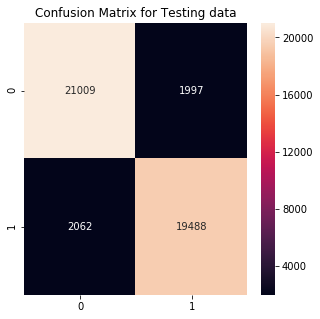

In [238]:
#Heatmap for Confusion matrix(Testing data)
sb.heatmap(Confusion_LOR_test, annot=True,  fmt='');
title = 'Confusion Matrix for Testing data'
plt.title(title);
rcParams['figure.figsize'] = 5,5

In [247]:
#Classification report(For test data)
print(classification_report(y_test_pred_final.attack, y_test_pred_final.final_predicted))

             precision    recall  f1-score   support

          0       0.91      0.91      0.91     23006
          1       0.91      0.90      0.91     21550

avg / total       0.91      0.91      0.91     44556



## Calculating other metrics for testing data

In [239]:
TP = Confusion_LOR_test[1,1] # true positive 
TN = Confusion_LOR_test[0,0] # true negatives
FP = Confusion_LOR_test[0,1] # false positives
FN = Confusion_LOR_test[1,0] # false negatives

In [240]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.9043155452436195

In [241]:
# Let us calculate specificity
TN / float(TN+FP)

0.9131965574198035

In [242]:
# Calculate false postive rate 
print(FP/ float(TN+FP))

0.08680344258019647


In [243]:
# Positive predictive value 
print (TP / float(TP+FP))

0.9070514312310914


In [244]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9106237267565341


## Precision and Recall score for testing data

In [245]:
# Precision score
Confusion_LOR_test[1,1]/(Confusion_LOR_test[0,1]+Confusion_LOR_test[1,1])

0.9070514312310914

In [246]:
# Recall score
Confusion_LOR_test[1,1]/(Confusion_LOR_test[1,0]+Confusion_LOR_test[1,1])

0.9043155452436195

## Plotting ROC Curve for testing data

In [248]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic curve')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [249]:
fpr, tpr, thresholds = metrics.roc_curve(y_test_pred_final.attack, y_test_pred_final.attack_Prob, drop_intermediate = False )

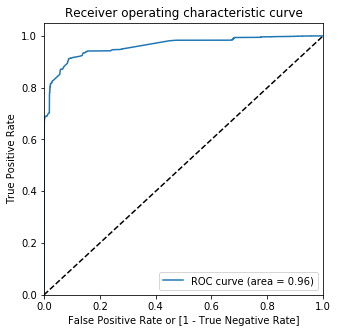

In [250]:
draw_roc(y_test_pred_final.attack, y_test_pred_final.attack_Prob)

## Precision and recall tradeoff

In [254]:
y_test_pred_final.attack, y_test_pred_final.final_predicted

(0        1
 1        0
 2        1
 3        1
 4        0
 5        1
 6        0
 7        1
 8        0
 9        1
 10       1
 11       1
 12       1
 13       0
 14       0
 15       1
 16       1
 17       0
 18       0
 19       1
 20       1
 21       0
 22       0
 23       0
 24       0
 25       1
 26       0
 27       0
 28       0
 29       1
         ..
 44526    1
 44527    0
 44528    1
 44529    0
 44530    1
 44531    1
 44532    0
 44533    0
 44534    0
 44535    0
 44536    1
 44537    0
 44538    0
 44539    1
 44540    1
 44541    1
 44542    1
 44543    0
 44544    1
 44545    1
 44546    0
 44547    1
 44548    1
 44549    1
 44550    0
 44551    0
 44552    1
 44553    0
 44554    0
 44555    1
 Name: attack, Length: 44556, dtype: int64, 0        1
 1        0
 2        1
 3        1
 4        0
 5        1
 6        0
 7        1
 8        0
 9        1
 10       1
 11       1
 12       1
 13       0
 14       0
 15       1
 16       1
 17       0
 18      

In [255]:
p, r, thresholds = precision_recall_curve(y_test_pred_final.attack, y_test_pred_final.attack_Prob)

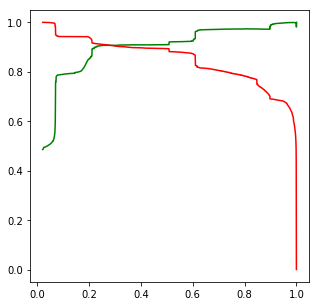

In [256]:
plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

## Inference

- Training accuracy - 91.2%
- Testing accuracy - 90.89%
- Precision Score - 90.70% (Testing data)
- Recall Score - 90.40% (Testing data)
- AUC score - 0.96 (Testing data)
- CutOff probability - 0.3

# Use case 2 - Multinomial Classification(Normal/DOS/Probe/R2L/U2R)

### Repeating few steps done earlier

In [3]:
# Loading Training data
data_train1 = pd.read_excel('C:\\Users\\Anindam\\Downloads\\Train_data.xlsx',header = None)

In [4]:
# Renaming columns
data_train1.columns = ['duration','protocol_type','service','flag','src_bytes','dst_bytes','land','wrong_fragment','urgent','hot','num_failed_logins','logged_in','num_compromised','root_shell','su_attempted','num_root','num_file_creations','num_shells','num_access_files','num_outbound_cmds','is_host_login','is_guest_login','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate','attack','last_flag']

In [5]:
# Loading Testing data
data_test1 = pd.read_excel('C:\\Users\\Anindam\\Downloads\\Test_data.xlsx',header = None)

In [6]:
# Renaming columns
data_test1.columns = ['duration','protocol_type','service','flag','src_bytes','dst_bytes','land','wrong_fragment','urgent','hot','num_failed_logins','logged_in','num_compromised','root_shell','su_attempted','num_root','num_file_creations','num_shells','num_access_files','num_outbound_cmds','is_host_login','is_guest_login','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate','attack','last_flag']

In [262]:
Counter(data_train1.attack)

Counter({'back': 956,
         'buffer_overflow': 30,
         'ftp_write': 8,
         'guess_passwd': 53,
         'imap': 11,
         'ipsweep': 3599,
         'land': 18,
         'loadmodule': 9,
         'multihop': 7,
         'neptune': 41214,
         'nmap': 1493,
         'normal': 67343,
         'perl': 3,
         'phf': 4,
         'pod': 201,
         'portsweep': 2931,
         'rootkit': 10,
         'satan': 3633,
         'smurf': 2646,
         'spy': 2,
         'teardrop': 892,
         'warezclient': 890,
         'warezmaster': 20})

In [263]:
Counter(data_test1.attack)

Counter({'apache2': 737,
         'back': 359,
         'buffer_overflow': 20,
         'ftp_write': 3,
         'guess_passwd': 1231,
         'httptunnel': 133,
         'imap': 1,
         'ipsweep': 141,
         'land': 7,
         'loadmodule': 2,
         'mailbomb': 293,
         'mscan': 996,
         'multihop': 18,
         'named': 17,
         'neptune': 4657,
         'nmap': 73,
         'normal': 9711,
         'perl': 2,
         'phf': 2,
         'pod': 41,
         'portsweep': 157,
         'processtable': 685,
         'ps': 15,
         'rootkit': 13,
         'saint': 319,
         'satan': 735,
         'sendmail': 14,
         'smurf': 665,
         'snmpgetattack': 178,
         'snmpguess': 331,
         'sqlattack': 2,
         'teardrop': 12,
         'udpstorm': 2,
         'warezmaster': 944,
         'worm': 2,
         'xlock': 9,
         'xsnoop': 4,
         'xterm': 13})

In [7]:
# Concatenating two dataframes

data1 = pd.concat([data_train1, data_test1], axis=0)

In [8]:
# Resetting the index

data1.reset_index(inplace=True)

In [269]:
data1.head()

,index,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,...,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,last_flag
0,0,0,tcp,ftp_data,SF,491,0,0,0,0,...,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,20
1,1,0,udp,other,SF,146,0,0,0,0,...,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,15
2,2,0,tcp,private,S0,0,0,0,0,0,...,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,19
3,3,0,tcp,http,SF,232,8153,0,0,0,...,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,21
4,4,0,tcp,http,SF,199,420,0,0,0,...,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,21


In [273]:
data1.shape

(148517, 44)

In [270]:
data1.describe()

,index,duration,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,last_flag
count,148517.000000,148517.000000,1.485170e+05,1.485170e+05,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,...,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000,148517.000000
mean,55136.045530,276.779305,4.022795e+04,1.708885e+04,0.000215,0.020523,0.000202,0.189379,0.004323,0.402789,...,119.462661,0.534521,0.084103,0.145932,0.030584,0.256122,0.251304,0.136220,0.136397,19.278480
std,38372.764374,2460.683131,5.409612e+06,3.703525e+06,0.014677,0.240069,0.019417,2.013160,0.072248,0.490461,...,111.232318,0.448061,0.194102,0.308638,0.108975,0.428500,0.429719,0.322741,0.335282,2.739757
min,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,18564.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,11.000000,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000
50%,51714.000000,0.000000,4.400000e+01,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,72.000000,0.600000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000
75%,88843.000000,0.000000,2.780000e+02,5.710000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,255.000000,1.000000,0.070000,0.050000,0.010000,0.600000,0.500000,0.000000,0.000000,21.000000
max,125972.000000,57715.000000,1.379964e+09,1.309937e+09,1.000000,3.000000,3.000000,101.000000,5.000000,1.000000,...,255.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,21.000000


In [271]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 148517 entries, 0 to 148516
Data columns (total 44 columns):
index                          148517 non-null int64
duration                       148517 non-null int64
protocol_type                  148517 non-null object
service                        148517 non-null object
flag                           148517 non-null object
src_bytes                      148517 non-null int64
dst_bytes                      148517 non-null int64
land                           148517 non-null int64
wrong_fragment                 148517 non-null int64
urgent                         148517 non-null int64
hot                            148517 non-null int64
num_failed_logins              148517 non-null int64
logged_in                      148517 non-null int64
num_compromised                148517 non-null int64
root_shell                     148517 non-null int64
su_attempted                   148517 non-null int64
num_root                       148517 

In [272]:
#Function to print all features in data1
def printall(data1, max_rows = 20):
    display(HTML(data1.to_html(max_rows = max_rows)))
printall(data1)

,index,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,last_flag
0,0,0,tcp,ftp_data,SF,491,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,2,0.0,0.0,0.0,0.0,1.00,0.00,0.00,150,25,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal,20
1,1,0,udp,other,SF,146,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13,1,0.0,0.0,0.0,0.0,0.08,0.15,0.00,255,1,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal,15
2,2,0,tcp,private,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,123,6,1.0,1.0,0.0,0.0,0.05,0.07,0.00,255,26,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,19
3,3,0,tcp,http,SF,232,8153,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,5,5,0.2,0.2,0.0,0.0,1.00,0.00,0.00,30,255,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal,21
4,4,0,tcp,http,SF,199,420,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,30,32,0.0,0.0,0.0,0.0,1.00,0.00,0.09,255,255,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal,21
5,5,0,tcp,private,REJ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,121,19,0.0,0.0,1.0,1.0,0.16,0.06,0.00,255,19,0.07,0.07,0.00,0.00,0.00,0.00,1.00,1.00,neptune,21
6,6,0,tcp,private,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,166,9,1.0,1.0,0.0,0.0,0.05,0.06,0.00,255,9,0.04,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,21
7,7,0,tcp,private,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,117,16,1.0,1.0,0.0,0.0,0.14,0.06,0.00,255,15,0.06,0.07,0.00,0.00,1.00,1.00,0.00,0.00,neptune,21
8,8,0,tcp,remote_job,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,270,23,1.0,1.0,0.0,0.0,0.09,0.05,0.00,255,23,0.09,0.05,0.00,0.00,1.00,1.00,0.00,0.00,neptune,21
9,9,0,tcp,private,S0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,133,8,1.0,1.0,0.0,0.0,0.06,0.06,0.00,255,13,0.05,0.06,0.00,0.00,1.00,1.00,0.00,0.00,neptune,21


## Data Preparation

In [9]:
# Dropping feature 'last_flag' and 'index'

data1.drop(['last_flag','index'], axis = 1, inplace = True)

In [275]:
# Checking for null values

data1.isnull().sum()

duration                       0
protocol_type                  0
service                        0
flag                           0
src_bytes                      0
dst_bytes                      0
land                           0
wrong_fragment                 0
urgent                         0
hot                            0
num_failed_logins              0
logged_in                      0
num_compromised                0
root_shell                     0
su_attempted                   0
num_root                       0
num_file_creations             0
num_shells                     0
num_access_files               0
num_outbound_cmds              0
is_host_login                  0
is_guest_login                 0
count                          0
srv_count                      0
serror_rate                    0
srv_serror_rate                0
rerror_rate                    0
srv_rerror_rate                0
same_srv_rate                  0
diff_srv_rate                  0
srv_diff_h

In [10]:
# Grouping the data into various classes

data1.loc[(data1.attack=='apache2'),'attack']='Dos'
data1.loc[(data1.attack=='back'),'attack']='Dos'
data1.loc[(data1.attack=='buffer_overflow'),'attack']='U2R'
data1.loc[(data1.attack=='ftp_write'),'attack']='R2L'
data1.loc[(data1.attack=='guess_passwd'),'attack']='R2L'

data1.loc[(data1.attack=='httptunnel'),'attack']='R2L'
data1.loc[(data1.attack=='imap'),'attack']='R2L'
data1.loc[(data1.attack=='ipsweep'),'attack']='Probe'
data1.loc[(data1.attack=='land'),'attack']='Dos'
data1.loc[(data1.attack=='loadmodule'),'attack']='U2R'

data1.loc[(data1.attack=='mailbomb'),'attack']='Dos'
data1.loc[(data1.attack=='mscan'),'attack']='Probe'
data1.loc[(data1.attack=='multihop'),'attack']='R2L'
data1.loc[(data1.attack=='named'),'attack']='R2L'
data1.loc[(data1.attack=='neptune'),'attack']='Dos'

data1.loc[(data1.attack=='nmap'),'attack']='Probe'
data1.loc[(data1.attack=='perl'),'attack']='U2R'
data1.loc[(data1.attack=='phf'),'attack']='R2L'
data1.loc[(data1.attack=='pod'),'attack']='Dos'
data1.loc[(data1.attack=='portsweep'),'attack']='Probe'

data1.loc[(data1.attack=='processtable'),'attack']='Dos'
data1.loc[(data1.attack=='ps'),'attack']='U2R'
data1.loc[(data1.attack=='rootkit'),'attack']='U2R'
data1.loc[(data1.attack=='saint'),'attack']='Probe'
data1.loc[(data1.attack=='satan'),'attack']='Probe'

data1.loc[(data1.attack=='sendmail'),'attack']='R2L'
data1.loc[(data1.attack=='smurf'),'attack']='Dos'
data1.loc[(data1.attack=='snmpgetattack'),'attack']='R2L'
data1.loc[(data1.attack=='snmpguess'),'attack']='R2L'
data1.loc[(data1.attack=='spy'),'attack']='R2L'

data1.loc[(data1.attack=='sqlattack'),'attack']='U2R'
data1.loc[(data1.attack=='teardrop'),'attack']='Dos'
data1.loc[(data1.attack=='udpstorm'),'attack']='Dos'
data1.loc[(data1.attack=='warezclient'),'attack']='R2L'
data1.loc[(data1.attack=='warezmaster'),'attack']='R2L'

data1.loc[(data1.attack=='worm'),'attack']='Dos'
data1.loc[(data1.attack=='xlock'),'attack']='R2L'
data1.loc[(data1.attack=='xsnoop'),'attack']='R2L'
data1.loc[(data1.attack=='xterm'),'attack']='U2R'
data1.loc[(data1.attack=='normal'),'attack']='Normal'

In [280]:
data1.head(50)

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,25,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,Normal
1,0,udp,other,SF,146,0,0,0,0,0,...,1,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,Normal
2,0,tcp,private,S0,0,0,0,0,0,0,...,26,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,Dos
3,0,tcp,http,SF,232,8153,0,0,0,0,...,255,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,Normal
4,0,tcp,http,SF,199,420,0,0,0,0,...,255,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Normal
5,0,tcp,private,REJ,0,0,0,0,0,0,...,19,0.07,0.07,0.00,0.00,0.00,0.00,1.00,1.00,Dos
6,0,tcp,private,S0,0,0,0,0,0,0,...,9,0.04,0.05,0.00,0.00,1.00,1.00,0.00,0.00,Dos
7,0,tcp,private,S0,0,0,0,0,0,0,...,15,0.06,0.07,0.00,0.00,1.00,1.00,0.00,0.00,Dos
8,0,tcp,remote_job,S0,0,0,0,0,0,0,...,23,0.09,0.05,0.00,0.00,1.00,1.00,0.00,0.00,Dos
9,0,tcp,private,S0,0,0,0,0,0,0,...,13,0.05,0.06,0.00,0.00,1.00,1.00,0.00,0.00,Dos


In [282]:
# After Categorization
Counter(data1.attack)

Counter({'Dos': 53387,
         'Normal': 77054,
         'Probe': 14077,
         'R2L': 3880,
         'U2R': 119})

In [11]:
# Categorizing 'flag' feature into 'Normal' and 'Error'

varlist =  ['flag']

# Defining the map function
def map_col2(x):
    return x.map({'S0': 'Error', 'S1': 'Normal','S2': 'Normal','S3': 'Error','SF' : 'Normal','SH': 'Error','REJ':'Error','RSTR':'Error','RSTO':'Error','OTH':'Error','RSTOS0':'Error'})

In [12]:
# Applying the function to the list
data1[varlist] = data1[varlist].apply(map_col2)

In [13]:
# Applying Dummy Encoding to feature 'protocol_type' and concatenating into original dataframe

prot_type1 = pd.get_dummies(data1['protocol_type'],drop_first = True)

In [289]:
prot_type1.head()

,tcp,udp
0,1,0
1,0,1
2,1,0
3,1,0
4,1,0


In [14]:
# Concatenating with original dataframe
data1 = pd.concat([data1, prot_type1], axis = 1)

In [15]:
# Dropping feature 'protocol_type'

data1.drop(['protocol_type'],axis = 1,inplace = True)

In [292]:
data1.head(10)

,duration,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,tcp,udp
0,0,ftp_data,Normal,491,0,0,0,0,0,0,...,0.03,0.17,0.00,0.00,0.00,0.05,0.00,Normal,1,0
1,0,other,Normal,146,0,0,0,0,0,0,...,0.60,0.88,0.00,0.00,0.00,0.00,0.00,Normal,0,1
2,0,private,Error,0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.00,1.00,0.00,0.00,Dos,1,0
3,0,http,Normal,232,8153,0,0,0,0,0,...,0.00,0.03,0.04,0.03,0.01,0.00,0.01,Normal,1,0
4,0,http,Normal,199,420,0,0,0,0,0,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,Normal,1,0
5,0,private,Error,0,0,0,0,0,0,0,...,0.07,0.00,0.00,0.00,0.00,1.00,1.00,Dos,1,0
6,0,private,Error,0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.00,1.00,0.00,0.00,Dos,1,0
7,0,private,Error,0,0,0,0,0,0,0,...,0.07,0.00,0.00,1.00,1.00,0.00,0.00,Dos,1,0
8,0,remote_job,Error,0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.00,1.00,0.00,0.00,Dos,1,0
9,0,private,Error,0,0,0,0,0,0,0,...,0.06,0.00,0.00,1.00,1.00,0.00,0.00,Dos,1,0


In [16]:
# Applying Dummy Encoding to feature 'flag' and concatenating into original dataframe

flag_type1 = pd.get_dummies(data1['flag'], drop_first = True)

In [294]:
flag_type1.head()

,Normal
0,1
1,1
2,0
3,1
4,1


In [17]:
# Concatenating with original dataframe
data1 = pd.concat([data1, flag_type1], axis = 1)

In [18]:
# Dropping feature 'flag'
data1.drop(['flag'], axis = 1, inplace = True)

In [19]:
# Applying Label Encoding to feature 'service' and 'attack'

le = LabelEncoder()

In [20]:
data1.service = le.fit_transform(data1.service)

In [21]:
data1.attack = le.fit_transform(data1.attack)

In [300]:
data1.head()

,duration,service,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,...,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,tcp,udp,Normal
0,0,20,491,0,0,0,0,0,0,0,...,0.17,0.00,0.00,0.00,0.05,0.00,1,1,0,1
1,0,44,146,0,0,0,0,0,0,0,...,0.88,0.00,0.00,0.00,0.00,0.00,1,0,1,1
2,0,49,0,0,0,0,0,0,0,0,...,0.00,0.00,1.00,1.00,0.00,0.00,0,1,0,0
3,0,24,232,8153,0,0,0,0,0,1,...,0.03,0.04,0.03,0.01,0.00,0.01,1,1,0,1
4,0,24,199,420,0,0,0,0,0,1,...,0.00,0.00,0.00,0.00,0.00,0.00,1,1,0,1


Text(0,0.5,'Count')

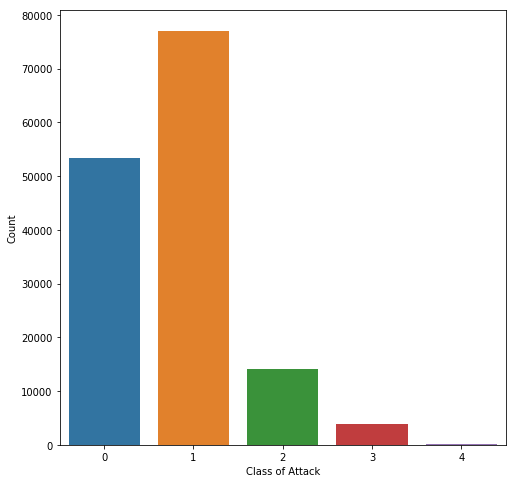

In [301]:
# Comparing the number of classes present in the dataset
rcParams['figure.figsize'] = 8,8
y = data1['attack'].value_counts()
sb.barplot(y.index, y.values)
plt.xlabel('Class of Attack')
plt.ylabel('Count')

- '0' = Dos
- '1' = Normal
- '2' = Probe
- '3' = R2L
- '4' = U2R

In [302]:
data2 = data1.corr()

In [303]:
#Function to print all features in data1
def printall(data2, max_rows = 100):
    display(HTML(data2.to_html(max_rows = max_rows)))
printall(data2)

,duration,service,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,num_compromised,root_shell,su_attempted,num_root,num_file_creations,num_shells,num_access_files,num_outbound_cmds,is_host_login,is_guest_login,count,srv_count,serror_rate,srv_serror_rate,rerror_rate,srv_rerror_rate,same_srv_rate,diff_srv_rate,srv_diff_host_rate,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,attack,tcp,udp,Normal
duration,1.000000,0.097319,0.068959,0.034056,-0.001651,-0.009616,0.002426,0.000664,0.000525,-0.064474,0.043998,0.046792,0.087257,0.046908,0.083243,-0.000996,0.067388,NaN,-0.000824,-0.000260,-0.078091,-0.039094,-0.064628,-0.064626,0.164661,0.165058,0.074720,-0.017784,-0.039485,0.050311,-0.098013,-0.104631,0.223635,0.201276,-0.025950,-0.053810,-0.052306,0.143896,0.163306,0.115593,0.000918,0.020771,-0.058176
service,0.097319,1.000000,-0.002055,0.003173,-0.011187,0.076063,0.015840,-0.065115,0.072406,-0.163259,0.019022,0.038076,0.039913,0.019446,0.032580,0.012314,0.028001,NaN,-0.001367,-0.086747,0.107581,-0.233105,0.251194,0.248708,0.176679,0.174077,-0.362576,0.213620,-0.075738,0.207738,-0.395161,-0.444806,0.274431,-0.116957,-0.161065,0.257416,0.256548,0.185974,0.180174,-0.114683,0.220971,-0.099386,-0.343708
src_bytes,0.068959,-0.002055,1.000000,0.000212,-0.000109,-0.000633,-0.000074,0.000347,-0.000443,-0.003286,-0.000079,-0.000274,-0.000166,-0.000087,-0.000151,-0.000130,-0.000302,NaN,-0.000067,-0.000817,-0.004796,-0.002609,-0.002785,-0.002990,0.011591,0.011812,0.003634,-0.000637,-0.002500,-0.005586,-0.006663,-0.006312,0.000730,0.000559,-0.001424,-0.004003,-0.002959,-0.001746,0.010494,0.011338,0.003483,-0.002723,-0.005626
dst_bytes,0.034056,0.003173,0.000212,1.000000,-0.000068,-0.000394,0.000179,-0.000297,0.000096,-0.002635,0.001253,0.000971,0.001155,0.001250,0.000086,-0.000061,0.000353,NaN,-0.000038,-0.000461,-0.003226,-0.001611,-0.002665,-0.002649,0.009446,0.009377,0.003450,-0.001588,-0.001553,0.002225,-0.003977,-0.004168,0.009834,0.010847,-0.001143,-0.002639,-0.002567,0.009986,0.009599,0.007054,0.002167,-0.001686,-0.004171
land,-0.001651,-0.011187,-0.000109,-0.000068,1.000000,-0.001255,-0.000153,-0.001381,-0.000878,-0.012056,-0.000168,-0.000571,-0.000338,-0.000177,-0.000342,-0.000278,-0.000618,NaN,-0.000132,-0.001639,-0.010042,-0.005144,0.024544,0.025271,-0.005061,-0.005948,0.009253,-0.002565,0.040548,-0.024564,-0.015214,0.009425,-0.004612,0.032151,0.072119,0.020496,0.015019,-0.005983,-0.005972,-0.011608,0.006912,-0.005385,-0.018296
wrong_fragment,-0.009616,0.076063,-0.000633,-0.000394,-0.001255,1.000000,-0.000889,-0.008042,-0.005115,-0.070207,-0.000981,-0.003323,-0.001969,-0.001031,-0.001993,-0.001621,-0.003601,NaN,-0.000768,-0.009543,-0.019921,0.021143,-0.038162,-0.050461,-0.034368,-0.034639,0.051176,-0.025896,-0.022829,0.032552,-0.046659,-0.046590,0.051988,0.040057,-0.009777,-0.045495,-0.049994,0.019283,-0.034778,-0.088593,-0.181573,0.211450,0.068595
urgent,0.002426,0.015840,-0.000074,0.000179,-0.000153,-0.000889,1.000000,0.008151,0.037775,0.011253,0.029034,0.178312,0.065206,0.031588,0.023194,0.037359,0.028685,NaN,-0.000094,-0.001161,-0.007336,-0.003762,-0.006188,-0.006141,-0.004228,-0.004215,0.007793,-0.003621,-0.003916,-0.011494,-0.009655,-0.003882,0.007248,0.002249,0.005386,-0.005676,-0.006068,-0.003789,-0.001098,0.029906,0.004898,-0.003816,0.008347
hot,0.000664,-0.065115,0.000347,-0.000297,-0.001381,-0.008042,0.008151,1.000000,0.000297,0.113230,0.002582,0.025475,0.000437,0.002083,0.090855,0.009083,0.000777,NaN,0.006596,0.720317,-0.066004,-0.033403,-0.054440,-0.054144,-0.034769,-0.033947,0.066636,-0.017705,-0.026141,-0.012182,-0.051125,-0.036210,-0.009751,-0.033311,-0.022945,-0.053126,-0.053734,-0.031549,-0.034212,0.105457,0.044290,-0.034507,0.072981
num_failed_logins,0.000525,0.072406,-0.000443,0.000096,-0.000878,-0.005115,0

In [22]:
# Dropping feature 'num_outbound_cmds' as it has no significant correlation with other features

data1.drop(['num_outbound_cmds'],axis = 1,inplace = True)

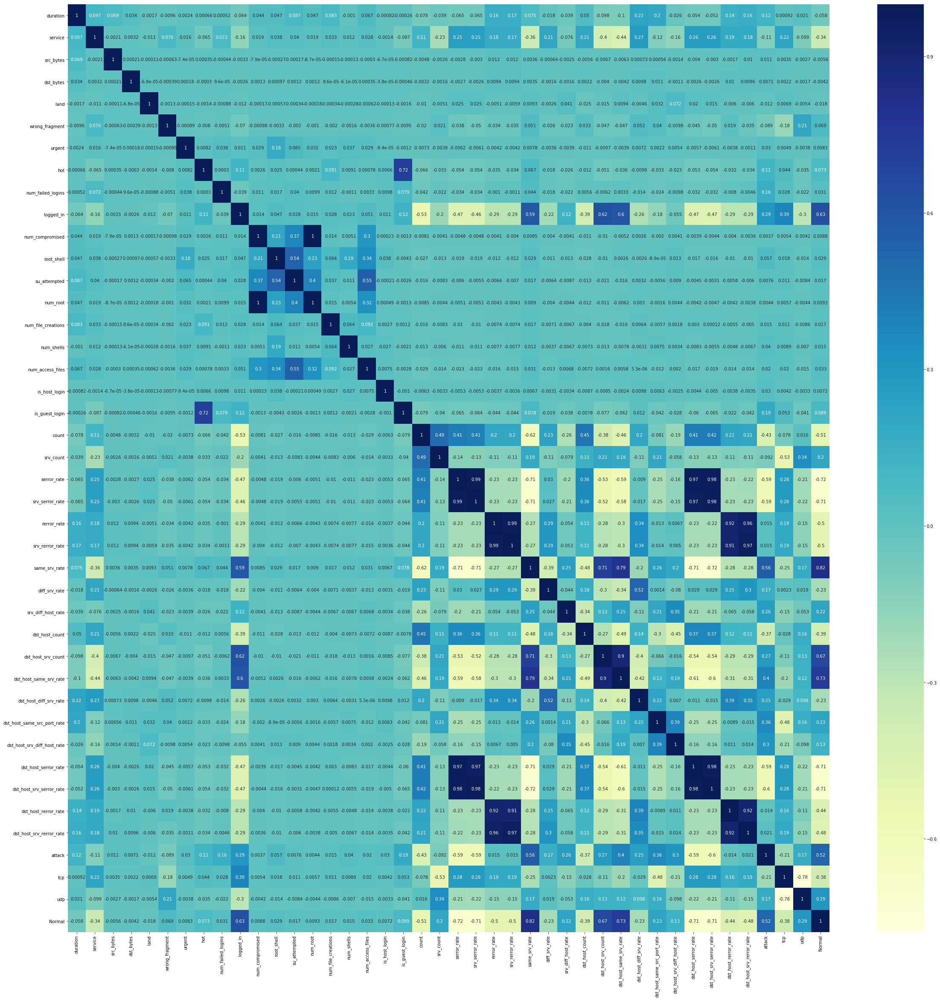

In [305]:
# Correlation matrix using heatmap before scaling
plt.figure(figsize = (40, 40))
sb.heatmap(data1.corr(), annot = True, cmap="YlGnBu")
plt.show()

## Inference

- Since the number of classes are highly imbalanced amongst each other, we will use SMOTE technique to equalize them.
- Feature 'serror_rate' and 'same_srv_rate' are (highly)negatively and positively correlated with target variable 'attack'.

In [23]:
# Selecting the list of predictors and target variables

X1 = data1.drop(['attack'], axis = 1)
y1 = data1['attack']

In [307]:
X1.head()

,duration,service,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,tcp,udp,Normal
0,0,20,491,0,0,0,0,0,0,0,...,0.03,0.17,0.00,0.00,0.00,0.05,0.00,1,0,1
1,0,44,146,0,0,0,0,0,0,0,...,0.60,0.88,0.00,0.00,0.00,0.00,0.00,0,1,1
2,0,49,0,0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.00,1.00,0.00,0.00,1,0,0
3,0,24,232,8153,0,0,0,0,0,1,...,0.00,0.03,0.04,0.03,0.01,0.00,0.01,1,0,1
4,0,24,199,420,0,0,0,0,0,1,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1,0,1


In [308]:
y1.head()

0    1
1    1
2    0
3    1
4    1
Name: attack, dtype: int64

In [24]:
# Splitting the data into train and test
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, train_size=0.7, test_size=0.3, random_state=100)

In [310]:
X1_train.head()

,duration,service,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,tcp,udp,Normal
3848,0,24,280,12913,0,0,0,0,0,1,...,0.00,0.03,0.07,0.0,0.00,0.0,0.0,1,0,1
63237,0,20,12,0,0,0,0,0,0,1,...,0.08,0.35,0.01,0.0,0.01,0.0,0.0,1,0,1
82734,0,24,0,0,0,0,0,0,0,0,...,0.00,0.11,0.26,0.0,0.00,1.0,1.0,1,0,0
114184,0,19,0,0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.0,1.00,0.0,0.0,1,0,0
63773,0,60,0,0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.0,1.00,0.0,0.0,1,0,0


In [311]:
X1_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 103961 entries, 3848 to 38408
Data columns (total 41 columns):
duration                       103961 non-null int64
service                        103961 non-null int64
src_bytes                      103961 non-null int64
dst_bytes                      103961 non-null int64
land                           103961 non-null int64
wrong_fragment                 103961 non-null int64
urgent                         103961 non-null int64
hot                            103961 non-null int64
num_failed_logins              103961 non-null int64
logged_in                      103961 non-null int64
num_compromised                103961 non-null int64
root_shell                     103961 non-null int64
su_attempted                   103961 non-null int64
num_root                       103961 non-null int64
num_file_creations             103961 non-null int64
num_shells                     103961 non-null int64
num_access_files               103961 n

In [312]:
X1_train.shape

(103961, 41)

In [313]:
X1_test.head()

,duration,service,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,tcp,udp,Normal
107361,0,49,0,0,0,0,0,0,0,0,...,1.00,0.01,1.00,0.0,0.0,0.91,1.0,1,0,0
101250,0,24,295,6801,0,0,0,0,0,1,...,0.00,0.03,0.02,0.0,0.0,0.00,0.0,1,0,1
39280,0,14,8,0,0,0,0,0,0,0,...,0.00,1.00,0.26,0.0,0.0,0.00,0.0,0,0,1
35668,17864,44,1,0,0,0,0,0,0,0,...,0.73,1.00,0.00,0.0,0.0,1.00,1.0,1,0,0
2718,0,12,34,0,0,0,0,0,0,0,...,0.03,0.08,0.10,0.0,0.0,0.00,0.0,0,1,1


In [314]:
X1_test.shape

(44556, 41)

In [315]:
# Checking the number of classes in training data
Counter(y1_train)

Counter({0: 37225, 1: 54048, 2: 9883, 3: 2717, 4: 88})

In [316]:
# Checking the number of classes in testing data
Counter(y1_test)

Counter({0: 16162, 1: 23006, 2: 4194, 3: 1163, 4: 31})

In [ ]:
# Using SMOTE technique for oversampling
from imblearn.over_sampling import SMOTE

In [ ]:
smote = SMOTE()

In [ ]:
X1_train_smote, y1_train_smote = smote.fit_sample(X1_train,y1_train)

In [ ]:
print(X1_train_smote)

In [ ]:
print(y1_train_smote)

In [ ]:
type(X1_train_smote)

In [ ]:
# Checking the number of classes in Training set
Counter(y1_train_smote)

## Feature Scaling

In [ ]:
# Converting X1_train_smote to a dataframe which is an array
X1_train_smote = pd.DataFrame(X1_train_smote)

In [ ]:
type(X1_train_smote)

In [ ]:
# Renaming columns
X1_train_smote.columns = ['duration','service','src_bytes','dst_bytes','land','wrong_fragment','urgent','hot','num_failed_logins','logged_in','num_compromised','root_shell','su_attempted','num_root','num_file_creations','num_shells','num_access_files','is_host_login','is_guest_login','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate','tcp','udp','normal']

In [ ]:
X1_train_smote.head()

In [317]:
scaler = StandardScaler()

In [ ]:
X1_train_smote[['duration','src_bytes','dst_bytes','wrong_fragment','urgent','hot','num_failed_logins','num_compromised','num_root','num_file_creations','num_shells','num_access_files','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate']] = scaler.fit_transform(X1_train_smote[['duration','src_bytes','dst_bytes','wrong_fragment','urgent','hot','num_failed_logins','num_compromised','num_root','num_file_creations','num_shells','num_access_files','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate']])

In [ ]:
X1_train_smote.describe()

In [ ]:
# Heatmap after scaling
plt.figure(figsize = (40,40))
sb.heatmap(X1_train_smote.corr(),annot = True)
plt.show()

## Model Building using Recursive Feature Elimination and Random Forest Algorithm

In [320]:
#Calling the API
model_RF = RandomForestClassifier()

In [ ]:
# Running RFE with 13 variables as output
rfe1 = RFE(model_RF, 13)             
rfe1 = rfe1.fit(X1_train_smote, y1_train_smote)

In [ ]:
rfe1.support_

In [ ]:
list(zip(X1_train_smote.columns, rfe1.support_, rfe1.ranking_))

In [ ]:
col1 = X1_train_smote.columns[rfe1.support_]

In [ ]:
X1_train_smote.columns[~rfe1.support_]

In [ ]:
# Assigning relevant columns
X1_train_smote = X1_train_smote[col1]

In [ ]:
X1_train_smote.head()

In [ ]:
#Training
model_RF.fit(X1_train_smote,y1_train_smote)

In [ ]:
#Prediction on Training data
y1_train_pred = model_RF.predict(X1_train_smote)

In [ ]:
#Accuracy Score for Training data
accuracy_score(y1_train_smote,y1_train_pred)

In [ ]:
# Printing confusion matrix
Conf_Matrix_RF = confusion_matrix(y1_train_smote,y1_train_pred)
print(Conf_Matrix_RF)

In [ ]:
#Heatmap for Confusion matrix(Random Forest)
sb.heatmap(Conf_Matrix_RF, annot=True,  fmt='');
title = 'Confusion Matrix(Training Data)'
plt.title(title);
rcParams['figure.figsize'] = 9,9

In [ ]:
# Checking for VIF values
vif = pd.DataFrame()
vif['Features'] = X1_train_smote[col1].columns
vif['VIF'] = [variance_inflation_factor(X1_train_smote[col1].values, i) for i in range(X1_train_smote[col1].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

## Inference

- All VIF values are within range

In [ ]:
#Classification report(For training data)
print(classification_report(y1_train_smote,y1_train_pred))

## Predictions on test data

In [321]:
# Scaling the features

scaler = StandardScaler()

In [ ]:
X1_test[['duration','src_bytes','dst_bytes','wrong_fragment','urgent','hot','num_failed_logins','num_compromised','num_root','num_file_creations','num_shells','num_access_files','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate']] = scaler.fit_transform(X1_test[['duration','src_bytes','dst_bytes','wrong_fragment','urgent','hot','num_failed_logins','num_compromised','num_root','num_file_creations','num_shells','num_access_files','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate']])

In [ ]:
X1_test = X1_test[col1]

In [ ]:
X1_test.head()

In [ ]:
#Prediction on Testing data
y1_test_predict = model_RF.predict(X1_test)

In [ ]:
#Accuracy Score(For test data)
accuracy_score(y1_test,y1_test_predict)

In [ ]:
# Printing confusion matrix
Conf_Matrix_RF_test = confusion_matrix(y1_test,y1_test_predict)
print(Conf_Matrix_RF_test)

In [ ]:
#Heatmap for Confusion matrix(Random Forest)
sb.heatmap(Conf_Matrix_RF_test, annot=True,  fmt='');
title = 'Confusion Matrix(Testing Data)'
plt.title(title);
rcParams['figure.figsize'] = 9,9

In [ ]:
#Classification report(For testing data)
print(classification_report(y1_test,y1_test_predict))

## Inference

- Accuracy for Training data - 99.6%
- Accuracy for Testing data - 44%
- It is a clear case of overfitting after using SMOTE technique.
- We will now try for model building using the original data.

## Model building without SMOTE

In [25]:
# Selecting the list of predictors and target variables gain

X2 = data1.drop(['attack'], axis = 1)
y2 = data1['attack']

In [326]:
X2.head()

,duration,service,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,tcp,udp,Normal
0,0,20,491,0,0,0,0,0,0,0,...,0.03,0.17,0.00,0.00,0.00,0.05,0.00,1,0,1
1,0,44,146,0,0,0,0,0,0,0,...,0.60,0.88,0.00,0.00,0.00,0.00,0.00,0,1,1
2,0,49,0,0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.00,1.00,0.00,0.00,1,0,0
3,0,24,232,8153,0,0,0,0,0,1,...,0.00,0.03,0.04,0.03,0.01,0.00,0.01,1,0,1
4,0,24,199,420,0,0,0,0,0,1,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1,0,1


In [327]:
y2.head()

0    1
1    1
2    0
3    1
4    1
Name: attack, dtype: int64

In [26]:
# Splitting the data into train and test
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, train_size=0.7, test_size=0.3, random_state=100)

In [329]:
X2_train.head()

,duration,service,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,tcp,udp,Normal
3848,0,24,280,12913,0,0,0,0,0,1,...,0.00,0.03,0.07,0.0,0.00,0.0,0.0,1,0,1
63237,0,20,12,0,0,0,0,0,0,1,...,0.08,0.35,0.01,0.0,0.01,0.0,0.0,1,0,1
82734,0,24,0,0,0,0,0,0,0,0,...,0.00,0.11,0.26,0.0,0.00,1.0,1.0,1,0,0
114184,0,19,0,0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.0,1.00,0.0,0.0,1,0,0
63773,0,60,0,0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.0,1.00,0.0,0.0,1,0,0


## Feature scaling

In [27]:
scaler = StandardScaler()

In [28]:
X2_train[['duration','src_bytes','dst_bytes','wrong_fragment','urgent','hot','num_failed_logins','num_compromised','num_root','num_file_creations','num_shells','num_access_files','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate']] = scaler.fit_transform(X2_train[['duration','src_bytes','dst_bytes','wrong_fragment','urgent','hot','num_failed_logins','num_compromised','num_root','num_file_creations','num_shells','num_access_files','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate']])

In [332]:
X2_train.describe()

,duration,service,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,tcp,udp,Normal
count,1.039610e+05,103961.000000,1.039610e+05,1.039610e+05,103961.000000,1.039610e+05,1.039610e+05,1.039610e+05,1.039610e+05,103961.000000,...,1.039610e+05,1.039610e+05,1.039610e+05,1.039610e+05,1.039610e+05,1.039610e+05,1.039610e+05,103961.000000,103961.000000,103961.000000
mean,6.946895e-16,31.703812,-6.574257e-16,2.871974e-16,0.000240,-1.285642e-15,-1.498899e-15,2.070036e-15,-2.768344e-15,0.403401,...,-4.292171e-16,2.274068e-15,1.798734e-16,7.501387e-16,1.734471e-15,5.600453e-17,2.926236e-16,0.818009,0.119054,0.609613
std,1.000005e+00,16.286077,1.000005e+00,1.000005e+00,0.015505,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,0.490582,...,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,0.385839,0.323854,0.487839
min,-1.109638e-01,0.000000,-7.262226e-03,-5.306257e-03,0.000000,-8.470501e-02,-9.808118e-03,-9.350373e-02,-6.134201e-02,0.000000,...,-4.327471e-01,-4.728111e-01,-2.808240e-01,-5.979834e-01,-5.848992e-01,-4.198302e-01,-4.044378e-01,0.000000,0.000000,0.000000
25%,-1.109638e-01,20.000000,-7.262226e-03,-5.306257e-03,0.000000,-8.470501e-02,-9.808118e-03,-9.350373e-02,-6.134201e-02,0.000000,...,-4.327471e-01,-4.728111e-01,-2.808240e-01,-5.979834e-01,-5.848992e-01,-4.198302e-01,-4.044378e-01,1.000000,0.000000,0.000000
50%,-1.109638e-01,24.000000,-7.253248e-03,-5.306257e-03,0.000000,-8.470501e-02,-9.808118e-03,-9.350373e-02,-6.134201e-02,0.000000,...,-3.292691e-01,-4.728111e-01,-2.808240e-01,-5.979834e-01,-5.848992e-01,-4.198302e-01,-4.044378e-01,1.000000,0.000000,1.000000
75%,-1.109638e-01,49.000000,-7.205504e-03,-4.846950e-03,0.000000,-8.470501e-02,-9.808118e-03,-9.350373e-02,-6.134201e-02,1.000000,...,-7.057408e-02,-3.107393e-01,-1.884090e-01,8.020465e-01,6.016812e-01,-4.198302e-01,-4.044378e-01,1.000000,0.000000,1.000000
max,2.353591e+01,69.000000,2.815549e+02,3.219849e+02,1.000000,1.253739e+01,1.529394e+02,5.037401e+01,6.807089e+01,1.000000,...,4.741153e+00,2.768625e+00,8.960681e+00,1.735400e+00,1.741729e+00,2.693023e+00,2.590612e+00,1.000000,1.000000,1.000000


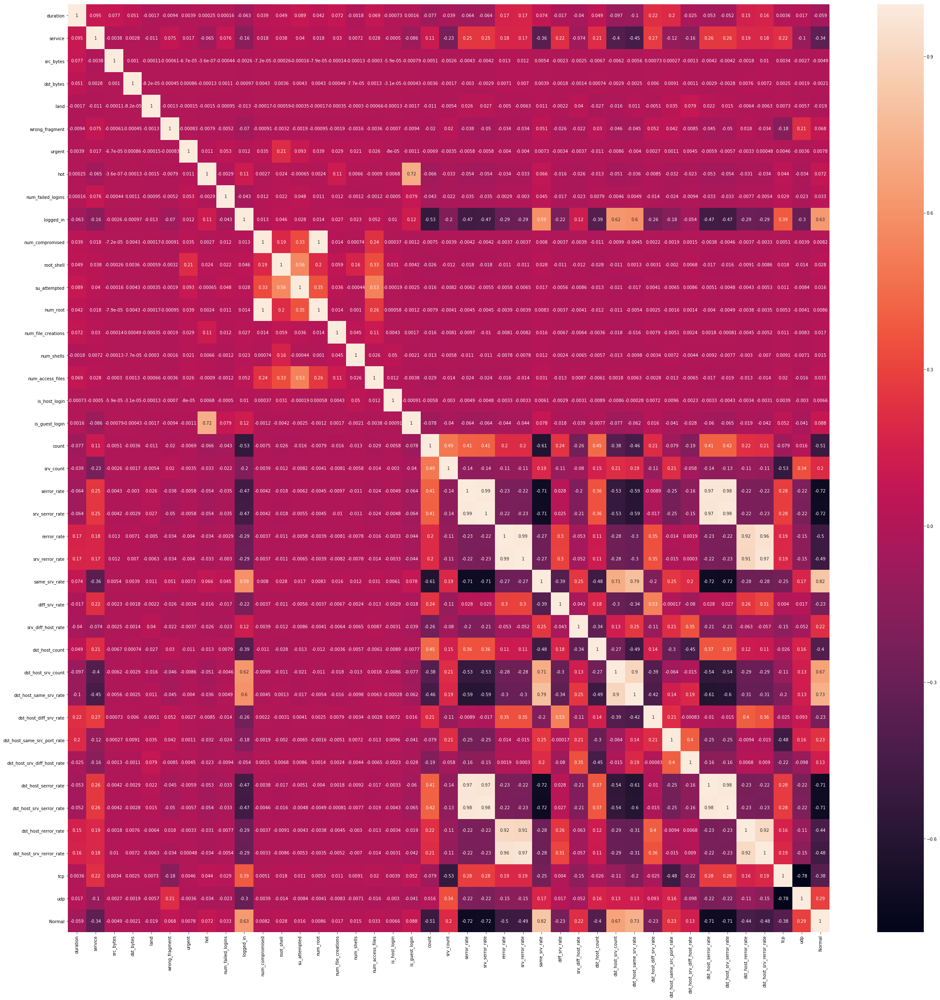

In [333]:
# Heatmap after scaling
plt.figure(figsize = (40,40))
sb.heatmap(X2_train.corr(),annot = True)
plt.show()

## Model Building using Recursive Feature Elimination and Random Forest Algorithm

In [29]:
#Calling the API
model_RF1 = RandomForestClassifier()

In [30]:
# Running RFE with 13 variables as output
rfe2 = RFE(model_RF1, 13)             
rfe2 = rfe2.fit(X2_train, y2_train)

In [31]:
rfe2.support_

array([False,  True,  True,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True,  True, False, False, False, False,  True,  True,
       False,  True,  True, False,  True,  True, False,  True, False,
        True, False, False, False, False])

In [32]:
list(zip(X2_train.columns, rfe2.support_, rfe2.ranking_))

[('duration', False, 11),
 ('service', True, 1),
 ('src_bytes', True, 1),
 ('dst_bytes', True, 1),
 ('land', False, 26),
 ('wrong_fragment', False, 13),
 ('urgent', False, 28),
 ('hot', False, 8),
 ('num_failed_logins', False, 17),
 ('logged_in', False, 6),
 ('num_compromised', False, 19),
 ('root_shell', False, 23),
 ('su_attempted', False, 29),
 ('num_root', False, 21),
 ('num_file_creations', False, 22),
 ('num_shells', False, 24),
 ('num_access_files', False, 25),
 ('is_host_login', False, 27),
 ('is_guest_login', False, 20),
 ('count', True, 1),
 ('srv_count', True, 1),
 ('serror_rate', False, 14),
 ('srv_serror_rate', False, 16),
 ('rerror_rate', False, 12),
 ('srv_rerror_rate', False, 18),
 ('same_srv_rate', True, 1),
 ('diff_srv_rate', True, 1),
 ('srv_diff_host_rate', False, 15),
 ('dst_host_count', True, 1),
 ('dst_host_srv_count', True, 1),
 ('dst_host_same_srv_rate', False, 4),
 ('dst_host_diff_srv_rate', True, 1),
 ('dst_host_same_src_port_rate', True, 1),
 ('dst_host_srv_

In [33]:
col2 = X2_train.columns[rfe2.support_]

In [34]:
X2_train.columns[~rfe2.support_]

Index(['duration', 'land', 'wrong_fragment', 'urgent', 'hot',
       'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell',
       'su_attempted', 'num_root', 'num_file_creations', 'num_shells',
       'num_access_files', 'is_host_login', 'is_guest_login', 'serror_rate',
       'srv_serror_rate', 'rerror_rate', 'srv_rerror_rate',
       'srv_diff_host_rate', 'dst_host_same_srv_rate',
       'dst_host_srv_diff_host_rate', 'dst_host_srv_serror_rate',
       'dst_host_srv_rerror_rate', 'tcp', 'udp', 'Normal'],
      dtype='object')

In [35]:
# Assigning relevant columns
X2_train = X2_train[col2]

In [341]:
X2_train.head()

,service,src_bytes,dst_bytes,count,srv_count,diff_srv_rate,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_srv_serror_rate,Normal
3848,24,-0.007205,0.005081,-0.696008,-0.335270,-0.348071,1.217831,1.037189,-0.432747,-0.375568,0.366081,-0.584899,1
63237,20,-0.007260,-0.005306,-0.696008,-0.348471,-0.348071,0.174946,-0.414194,-0.018835,0.661691,-0.188409,-0.561633,1
82734,24,-0.007262,-0.005306,-0.704548,-0.361672,-0.348071,1.145908,1.037189,-0.432747,-0.116253,2.121967,-0.584899,0
114184,19,-0.007262,-0.005306,1.481709,-0.308869,-0.092424,-1.029766,-1.151050,-0.174052,-0.472811,-0.280824,1.741729,0
63773,60,-0.007262,-0.005306,1.678130,-0.361672,-0.092424,-1.065728,-1.195708,-0.174052,-0.472811,-0.280824,1.741729,0


In [36]:
#Training
model_RF1.fit(X2_train,y2_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [37]:
#Prediction on Training data
y2_train_pred = model_RF1.predict(X2_train)

In [38]:
#Accuracy Score for Training data
accuracy_score(y2_train,y2_train_pred)

0.9991439097353816

In [39]:
# Printing confusion matrix
Conf_Matrix_RF1 = confusion_matrix(y2_train,y2_train_pred)
print(Conf_Matrix_RF1)

[[37221     4     0     0     0]
 [   16 54012     3    17     0]
 [    0     3  9880     0     0]
 [    0    38     0  2679     0]
 [    0     8     0     0    80]]


In [41]:
# Checking for VIF values
vif = pd.DataFrame()
vif['Features'] = X2_train[col2].columns
vif['VIF'] = [variance_inflation_factor(X2_train[col2].values, i) for i in range(X2_train[col2].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,same_srv_rate,8.90
3,count,4.75
11,dst_host_serror_rate,4.67
4,srv_count,3.33
8,dst_host_srv_count,2.85
12,dst_host_rerror_rate,2.36
9,dst_host_diff_srv_rate,2.17
6,diff_srv_rate,1.98
7,dst_host_count,1.60
10,dst_host_same_src_port_rate,1.53


In [ ]:
# Removing feature 'dst_host_same_srv_rate' due to its high VIF value

col2 = col2.drop('dst_host_same_srv_rate', 1)
col2

In [42]:
# Assigning relevant columns once again

X2_train = X2_train[col2]

In [43]:
#Training
model_RF1.fit(X2_train,y2_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [44]:
#Prediction on Training data
y2_train_pred = model_RF1.predict(X2_train)

In [45]:
#Accuracy Score for Training data
accuracy_score(y2_train,y2_train_pred)

0.999057338809746

In [46]:
# Checking for VIF values

vif = pd.DataFrame()
vif['Features'] = X2_train[col2].columns
vif['VIF'] = [variance_inflation_factor(X2_train[col2].values, i) for i in range(X2_train[col2].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,same_srv_rate,8.90
3,count,4.75
11,dst_host_serror_rate,4.67
4,srv_count,3.33
8,dst_host_srv_count,2.85
12,dst_host_rerror_rate,2.36
9,dst_host_diff_srv_rate,2.17
6,diff_srv_rate,1.98
7,dst_host_count,1.60
10,dst_host_same_src_port_rate,1.53


#### All VIF values are within range

In [47]:
# Printing confusion matrix
Conf_Matrix_RF1 = confusion_matrix(y2_train,y2_train_pred)
print(Conf_Matrix_RF1)

[[37218     6     1     0     0]
 [   14 54023     1     9     1]
 [    0     2  9881     0     0]
 [    0    53     0  2663     1]
 [    0     9     0     1    78]]


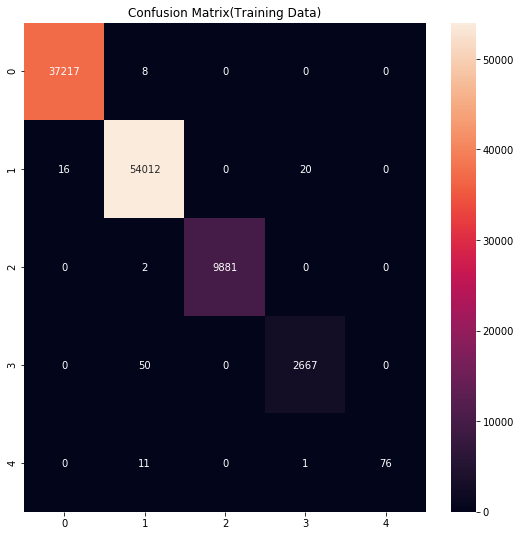

In [362]:
#Heatmap for Confusion matrix(Random Forest)
sb.heatmap(Conf_Matrix_RF1, annot=True,  fmt='');
title = 'Confusion Matrix(Training Data)'
plt.title(title);
rcParams['figure.figsize'] = 9,9

## Predictions on Testing data

In [48]:
# Scaling the features

scaler = StandardScaler()

In [49]:
X2_test[['duration','src_bytes','dst_bytes','wrong_fragment','urgent','hot','num_failed_logins','num_compromised','num_root','num_file_creations','num_shells','num_access_files','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate']] = scaler.fit_transform(X2_test[['duration','src_bytes','dst_bytes','wrong_fragment','urgent','hot','num_failed_logins','num_compromised','num_root','num_file_creations','num_shells','num_access_files','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate']])

In [50]:
X2_test = X2_test[col2]

In [357]:
X2_test.head()

,service,src_bytes,dst_bytes,count,srv_count,diff_srv_rate,dst_host_srv_count,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_srv_serror_rate,Normal
107361,49,-0.007924,-0.006406,-0.706683,-0.361399,-0.348177,-1.054334,4.667314,-0.440502,8.749617,-0.584611,0
101250,24,-0.007878,-0.005358,-0.663570,-0.294253,-0.348177,1.220099,-0.434593,-0.375765,-0.099709,-0.584611,1
39280,14,-0.007922,-0.006406,-0.706683,0.081764,-0.348177,-0.523932,-0.434593,2.763975,2.067473,-0.584611,1
35668,44,-0.007924,-0.006406,-0.698060,-0.347970,-0.348177,-1.054334,3.289799,2.763975,-0.280307,-0.584611,0
2718,12,-0.007918,-0.006406,-0.706683,-0.347970,-0.348177,-0.892516,-0.281536,-0.213923,0.622685,-0.584611,1


In [51]:
#Prediction on Testing data
y2_test_predict = model_RF1.predict(X2_test)

In [52]:
#Accuracy Score(For test data)
accuracy_score(y2_test,y2_test_predict)

0.9254421402280276

In [53]:
# Printing confusion matrix for testing data
Conf_Matrix_RF_test1 = confusion_matrix(y2_test,y2_test_predict)
print(Conf_Matrix_RF_test1)

[[15661   306   194     1     0]
 [  578 21234  1159    35     0]
 [    7    86  4100     1     0]
 [   26   804    93   238     2]
 [    4    22     4     0     1]]


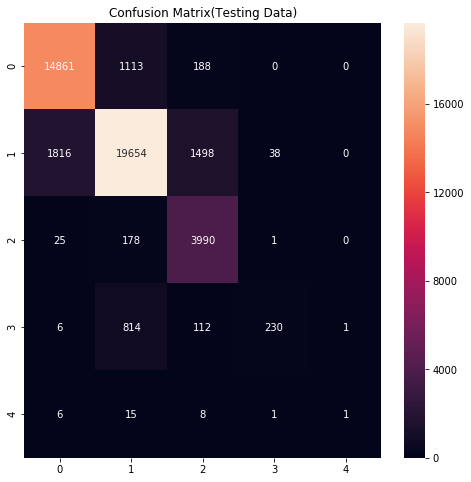

In [361]:
#Heatmap for Confusion matrix(Random Forest)
sb.heatmap(Conf_Matrix_RF_test1, annot=True,  fmt='');
title = 'Confusion Matrix(Testing Data)'
plt.title(title);
rcParams['figure.figsize'] = 9,9

In [54]:
#Classification report(For testing data)
print(classification_report(y2_test,y2_test_predict))

             precision    recall  f1-score   support

          0       0.96      0.97      0.97     16162
          1       0.95      0.92      0.93     23006
          2       0.74      0.98      0.84      4194
          3       0.87      0.20      0.33      1163
          4       0.33      0.03      0.06        31

avg / total       0.93      0.93      0.92     44556



## Inference

- Accuracy for Training data - 99.8%
- Accuracy for Testing data - 92%
- Precision and Recall score of class 'U2R' is quite less as compared with other classes i.e., 0.5 and 0.03 respectively.
- Avg Precision score - 93%
- Avg Recall score - 93%

In [367]:
# Predicting probabilities
y2_test_prob = model_RF1.predict_proba(X2_test)

In [368]:
print(y2_test_prob)

[[0.  0.  1.  0.  0. ]
 [0.  1.  0.  0.  0. ]
 [0.  0.2 0.8 0.  0. ]
 ...
 [0.  1.  0.  0.  0. ]
 [0.  1.  0.  0.  0. ]
 [1.  0.  0.  0.  0. ]]


## Calculating other metrics

- TP - True Positive
- TN - True Negative
- FP - False Positive
- FN - False Negative

### Class - 'Dos'

In [371]:
# Calculating metrics for class '0' - Dos

TP1 = Conf_Matrix_RF_test1[0,0]
TN1 = Conf_Matrix_RF_test1[1,1] + Conf_Matrix_RF_test1[1,2] + Conf_Matrix_RF_test1[1,3] + Conf_Matrix_RF_test1[1,4] + Conf_Matrix_RF_test1[2,1] + Conf_Matrix_RF_test1[2,2] + Conf_Matrix_RF_test1[2,3] + Conf_Matrix_RF_test1[2,4] + Conf_Matrix_RF_test1[3,1] + Conf_Matrix_RF_test1[3,2] + Conf_Matrix_RF_test1[3,3] + Conf_Matrix_RF_test1[3,4] + Conf_Matrix_RF_test1[4,1] + Conf_Matrix_RF_test1[4,2] + Conf_Matrix_RF_test1[4,3] + Conf_Matrix_RF_test1[4,4]
FP1 = Conf_Matrix_RF_test1[1,0] + Conf_Matrix_RF_test1[2,0] + Conf_Matrix_RF_test1[3,0] + Conf_Matrix_RF_test1[4,0]
FN1 = Conf_Matrix_RF_test1[0,1] + Conf_Matrix_RF_test1[0,2] + Conf_Matrix_RF_test1[0,3] + Conf_Matrix_RF_test1[0,4]

In [372]:
# Sensitivity of class '0'

TP1 / float(TP1+FN1)

0.9195025368147507

In [373]:
# Specificity of class '0'

TN1 / float(TN1+FP1)

0.9347397337465662

In [374]:
# False positive rate for class '0'

print(FP1/ float(TN1+FP1))

0.06526026625343383


In [375]:
# Positive predictive value for class '0'

print (TP1 / float(TP1+FP1))

0.8891348570061026


In [376]:
# Negative predictive value for class '0'
print (TN1 / float(TN1+ FN1))

0.953272035054953


### Class - 'Normal'

In [377]:
# Calculating metrics for class '1' - Normal

TP2 = Conf_Matrix_RF_test1[1,1]
TN2 = Conf_Matrix_RF_test1[1,0] + Conf_Matrix_RF_test1[1,2] + Conf_Matrix_RF_test1[1,3] + Conf_Matrix_RF_test1[1,4] + Conf_Matrix_RF_test1[2,0] + Conf_Matrix_RF_test1[2,2] + Conf_Matrix_RF_test1[2,3] + Conf_Matrix_RF_test1[2,4] + Conf_Matrix_RF_test1[3,0] + Conf_Matrix_RF_test1[3,2] + Conf_Matrix_RF_test1[3,3] + Conf_Matrix_RF_test1[3,4] + Conf_Matrix_RF_test1[4,0] + Conf_Matrix_RF_test1[4,2] + Conf_Matrix_RF_test1[4,3] + Conf_Matrix_RF_test1[4,4]
FP2 = Conf_Matrix_RF_test1[0,1] + Conf_Matrix_RF_test1[2,1] + Conf_Matrix_RF_test1[3,1] + Conf_Matrix_RF_test1[4,1]
FN2 = Conf_Matrix_RF_test1[1,0] + Conf_Matrix_RF_test1[1,2] + Conf_Matrix_RF_test1[1,3] + Conf_Matrix_RF_test1[1,4]

In [378]:
# Sensitivity of class '1'

TP2 / float(TP2+FN2)

0.8542988785534208

In [379]:
# Specificity of class '1'

TN2 / float(TN2+FP2)

0.7848371054501168

In [380]:
# False positive rate for class '1'

print(FP2/ float(TN2+FP2))

0.21516289454988327


In [381]:
# Positive predictive value for class '1'

print (TP2 / float(TP2+FP2))

0.9026361715807845


In [382]:
# Negative predictive value for class '1'
print (TN2 / float(TN2+ FN2))

0.6976093820478123


### Class - 'Probe'

In [383]:
# Calculating metrics for class '2' - Probe

TP3 = Conf_Matrix_RF_test1[2,2]
TN3 = Conf_Matrix_RF_test1[0,0] + Conf_Matrix_RF_test1[0,1] + Conf_Matrix_RF_test1[0,3] + Conf_Matrix_RF_test1[0,4] + Conf_Matrix_RF_test1[1,0] + Conf_Matrix_RF_test1[1,1] + Conf_Matrix_RF_test1[1,3] + Conf_Matrix_RF_test1[1,4] + Conf_Matrix_RF_test1[3,0] + Conf_Matrix_RF_test1[3,1] + Conf_Matrix_RF_test1[3,3] + Conf_Matrix_RF_test1[3,4] + Conf_Matrix_RF_test1[4,0] + Conf_Matrix_RF_test1[4,1] + Conf_Matrix_RF_test1[4,3] + Conf_Matrix_RF_test1[4,4]
FP3 = Conf_Matrix_RF_test1[0,2] + Conf_Matrix_RF_test1[1,2] + Conf_Matrix_RF_test1[3,2] + Conf_Matrix_RF_test1[4,2]
FN3 = Conf_Matrix_RF_test1[2,0] + Conf_Matrix_RF_test1[2,1] + Conf_Matrix_RF_test1[2,3] + Conf_Matrix_RF_test1[2,4]

In [384]:
# Sensitivity of class '2'

TP3 / float(TP3+FN3)

0.9513590844062947

In [385]:
# Specificity of class '2'

TN3 / float(TN3+FP3)

0.9552549427679501

In [386]:
# False positive rate for class '2'

print(FP3/ float(TN3+FP3))

0.044745057232049947


In [387]:
# Positive predictive value for class '2'

print (TP3 / float(TP3+FP3))

0.6884057971014492


In [388]:
# Negative predictive value for class '2'
print (TN3 / float(TN3+ FN3))

0.9947368421052631


### Class - 'R2L'

In [389]:
# Calculating metrics for class '3' - R2L

TP4 = Conf_Matrix_RF_test1[3,3]
TN4 = Conf_Matrix_RF_test1[0,0] + Conf_Matrix_RF_test1[0,1] + Conf_Matrix_RF_test1[0,2] + Conf_Matrix_RF_test1[0,4] + Conf_Matrix_RF_test1[1,0] + Conf_Matrix_RF_test1[1,1] + Conf_Matrix_RF_test1[1,2] + Conf_Matrix_RF_test1[1,4] + Conf_Matrix_RF_test1[2,0] + Conf_Matrix_RF_test1[2,1] + Conf_Matrix_RF_test1[2,2] + Conf_Matrix_RF_test1[2,4] + Conf_Matrix_RF_test1[4,0] + Conf_Matrix_RF_test1[4,1] + Conf_Matrix_RF_test1[4,2] + Conf_Matrix_RF_test1[4,4]
FP4 = Conf_Matrix_RF_test1[0,3] + Conf_Matrix_RF_test1[1,3] + Conf_Matrix_RF_test1[2,3] + Conf_Matrix_RF_test1[4,3]
FN4 = Conf_Matrix_RF_test1[3,0] + Conf_Matrix_RF_test1[3,1] + Conf_Matrix_RF_test1[3,2] + Conf_Matrix_RF_test1[3,4]

In [390]:
# Sensitivity of class '3'

TP4 / float(TP4+FN4)

0.19776440240756663

In [391]:
# Specificity of class '3'

TN4 / float(TN4+FP4)

0.9990781923351693

In [392]:
# False positive rate for class '3'

print(FP4/ float(TN4+FP4))

0.0009218076648307331


In [393]:
# Positive predictive value for class '3'

print (TP4 / float(TP4+FP4))

0.8518518518518519


In [394]:
# Negative predictive value for class '3'
print (TN4 / float(TN4+ FN4))

0.9789323939845549


### Class - 'U2R'

In [395]:
# Calculating metrics for class '4' - U2R

TP5 = Conf_Matrix_RF_test1[4,4]
TN5 = Conf_Matrix_RF_test1[0,0] + Conf_Matrix_RF_test1[0,1] + Conf_Matrix_RF_test1[0,2] + Conf_Matrix_RF_test1[0,3] + Conf_Matrix_RF_test1[1,0] + Conf_Matrix_RF_test1[1,1] + Conf_Matrix_RF_test1[1,2] + Conf_Matrix_RF_test1[1,3] + Conf_Matrix_RF_test1[2,0] + Conf_Matrix_RF_test1[2,1] + Conf_Matrix_RF_test1[2,2] + Conf_Matrix_RF_test1[2,3] + Conf_Matrix_RF_test1[3,0] + Conf_Matrix_RF_test1[3,1] + Conf_Matrix_RF_test1[3,2] + Conf_Matrix_RF_test1[3,3]
FP5 = Conf_Matrix_RF_test1[0,4] + Conf_Matrix_RF_test1[1,4] + Conf_Matrix_RF_test1[2,4] + Conf_Matrix_RF_test1[3,4]
FN5 = Conf_Matrix_RF_test1[4,0] + Conf_Matrix_RF_test1[4,1] + Conf_Matrix_RF_test1[4,2] + Conf_Matrix_RF_test1[4,3]

In [396]:
# Sensitivity of class '4'

TP5 / float(TP5 + FN5)

0.03225806451612903

In [397]:
# Specificity of class '4'

TN5 / float(TN5 + FP5)

0.9999775407074677

In [398]:
# False positive rate for class '4'

print(FP5/ float(TN5 + FP5))

2.2459292532285233e-05


In [399]:
# Positive predictive value for class '4'

print (TP5 / float(TP5 + FP5))

0.5


In [400]:
# Negative predictive value for class '4'
print (TN5 / float(TN5 + FN5))

0.9993266597836333


## Using Support Vector Machine algorithm for model prediction

In [55]:
# Calling the API
model_SVC = SVC()

In [56]:
# Selecting the list of predictors and target variables again

X3 = data1.drop(['attack'], axis = 1)
y3 = data1['attack']

In [57]:
# Splitting the data into train and test
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, train_size=0.7, test_size=0.3, random_state=100)

In [420]:
X3_train.head()

,duration,service,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,tcp,udp,Normal
3848,0,24,280,12913,0,0,0,0,0,1,...,0.00,0.03,0.07,0.0,0.00,0.0,0.0,1,0,1
63237,0,20,12,0,0,0,0,0,0,1,...,0.08,0.35,0.01,0.0,0.01,0.0,0.0,1,0,1
82734,0,24,0,0,0,0,0,0,0,0,...,0.00,0.11,0.26,0.0,0.00,1.0,1.0,1,0,0
114184,0,19,0,0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.0,1.00,0.0,0.0,1,0,0
63773,0,60,0,0,0,0,0,0,0,0,...,0.05,0.00,0.00,1.0,1.00,0.0,0.0,1,0,0


In [421]:
y3_train.head()

3848      1
63237     1
82734     1
114184    0
63773     0
Name: attack, dtype: int64

## Feature Scaling

In [58]:
scaler = StandardScaler()

In [59]:
X3_train[['duration','src_bytes','dst_bytes','wrong_fragment','urgent','hot','num_failed_logins','num_compromised','num_root','num_file_creations','num_shells','num_access_files','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate']] = scaler.fit_transform(X3_train[['duration','src_bytes','dst_bytes','wrong_fragment','urgent','hot','num_failed_logins','num_compromised','num_root','num_file_creations','num_shells','num_access_files','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate']])

In [424]:
X3_train.describe()

,duration,service,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,num_failed_logins,logged_in,...,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,tcp,udp,Normal
count,1.039610e+05,103961.000000,1.039610e+05,1.039610e+05,103961.000000,1.039610e+05,1.039610e+05,1.039610e+05,1.039610e+05,103961.000000,...,1.039610e+05,1.039610e+05,1.039610e+05,1.039610e+05,1.039610e+05,1.039610e+05,1.039610e+05,103961.000000,103961.000000,103961.000000
mean,6.946895e-16,31.703812,-6.574257e-16,2.871974e-16,0.000240,-1.285642e-15,-1.498899e-15,2.070036e-15,-2.768344e-15,0.403401,...,-4.292171e-16,2.274068e-15,1.798734e-16,7.501387e-16,1.734471e-15,5.600453e-17,2.926236e-16,0.818009,0.119054,0.609613
std,1.000005e+00,16.286077,1.000005e+00,1.000005e+00,0.015505,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,0.490582,...,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,1.000005e+00,0.385839,0.323854,0.487839
min,-1.109638e-01,0.000000,-7.262226e-03,-5.306257e-03,0.000000,-8.470501e-02,-9.808118e-03,-9.350373e-02,-6.134201e-02,0.000000,...,-4.327471e-01,-4.728111e-01,-2.808240e-01,-5.979834e-01,-5.848992e-01,-4.198302e-01,-4.044378e-01,0.000000,0.000000,0.000000
25%,-1.109638e-01,20.000000,-7.262226e-03,-5.306257e-03,0.000000,-8.470501e-02,-9.808118e-03,-9.350373e-02,-6.134201e-02,0.000000,...,-4.327471e-01,-4.728111e-01,-2.808240e-01,-5.979834e-01,-5.848992e-01,-4.198302e-01,-4.044378e-01,1.000000,0.000000,0.000000
50%,-1.109638e-01,24.000000,-7.253248e-03,-5.306257e-03,0.000000,-8.470501e-02,-9.808118e-03,-9.350373e-02,-6.134201e-02,0.000000,...,-3.292691e-01,-4.728111e-01,-2.808240e-01,-5.979834e-01,-5.848992e-01,-4.198302e-01,-4.044378e-01,1.000000,0.000000,1.000000
75%,-1.109638e-01,49.000000,-7.205504e-03,-4.846950e-03,0.000000,-8.470501e-02,-9.808118e-03,-9.350373e-02,-6.134201e-02,1.000000,...,-7.057408e-02,-3.107393e-01,-1.884090e-01,8.020465e-01,6.016812e-01,-4.198302e-01,-4.044378e-01,1.000000,0.000000,1.000000
max,2.353591e+01,69.000000,2.815549e+02,3.219849e+02,1.000000,1.253739e+01,1.529394e+02,5.037401e+01,6.807089e+01,1.000000,...,4.741153e+00,2.768625e+00,8.960681e+00,1.735400e+00,1.741729e+00,2.693023e+00,2.590612e+00,1.000000,1.000000,1.000000


In [426]:
print(col2)

Index(['service', 'src_bytes', 'dst_bytes', 'count', 'srv_count',
       'diff_srv_rate', 'dst_host_srv_count', 'dst_host_diff_srv_rate',
       'dst_host_same_src_port_rate', 'dst_host_srv_diff_host_rate',
       'dst_host_srv_serror_rate', 'Normal'],
      dtype='object')


In [60]:
X3_train = X3_train[col2]

In [428]:
X3_train.head()

,service,src_bytes,dst_bytes,count,srv_count,diff_srv_rate,dst_host_srv_count,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_srv_serror_rate,Normal
3848,24,-0.007205,0.005081,-0.696008,-0.335270,-0.348071,1.217831,-0.432747,-0.375568,0.366081,-0.584899,1
63237,20,-0.007260,-0.005306,-0.696008,-0.348471,-0.348071,0.174946,-0.018835,0.661691,-0.188409,-0.561633,1
82734,24,-0.007262,-0.005306,-0.704548,-0.361672,-0.348071,1.145908,-0.432747,-0.116253,2.121967,-0.584899,0
114184,19,-0.007262,-0.005306,1.481709,-0.308869,-0.092424,-1.029766,-0.174052,-0.472811,-0.280824,1.741729,0
63773,60,-0.007262,-0.005306,1.678130,-0.361672,-0.092424,-1.065728,-0.174052,-0.472811,-0.280824,1.741729,0


In [61]:
#Training
model_SVC.fit(X3_train,y3_train)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [62]:
#Prediction on Training data
y3_train_pred = model_SVC.predict(X3_train)

In [63]:
#Accuracy Score for Training data
accuracy_score(y3_train,y3_train_pred)

0.9725570165735228

In [64]:
# Printing confusion matrix
Conf_Matrix_SVC = confusion_matrix(y3_train,y3_train_pred)
print(Conf_Matrix_SVC)

[[36235   929    22    39     0]
 [  266 53078   187   517     0]
 [  109   141  9624     9     0]
 [   10   523    13  2171     0]
 [    5    66     3    14     0]]


In [433]:
# Checking for VIF values
vif = pd.DataFrame()
vif['Features'] = X3_train[col2].columns
vif['VIF'] = [variance_inflation_factor(X3_train[col2].values, i) for i in range(X3_train[col2].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
11,Normal,4.34
0,service,3.32
3,count,2.92
6,dst_host_srv_count,2.49
4,srv_count,2.48
10,dst_host_srv_serror_rate,2.27
7,dst_host_diff_srv_rate,1.77
8,dst_host_same_src_port_rate,1.59
5,diff_srv_rate,1.50
9,dst_host_srv_diff_host_rate,1.27


#### All VIF values are within range

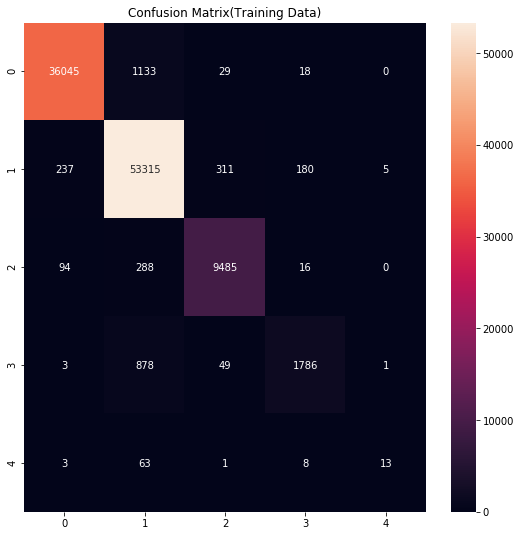

In [434]:
#Heatmap for Confusion matrix(Support Vector Machine)
sb.heatmap(Conf_Matrix_SVC, annot=True,  fmt='');
title = 'Confusion Matrix(Training Data)'
plt.title(title);
rcParams['figure.figsize'] = 9,9

## Prediction on Testing data

In [65]:
scaler = StandardScaler()

In [66]:
X3_test[['duration','src_bytes','dst_bytes','wrong_fragment','urgent','hot','num_failed_logins','num_compromised','num_root','num_file_creations','num_shells','num_access_files','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate']] = scaler.fit_transform(X3_test[['duration','src_bytes','dst_bytes','wrong_fragment','urgent','hot','num_failed_logins','num_compromised','num_root','num_file_creations','num_shells','num_access_files','count','srv_count','serror_rate','srv_serror_rate','rerror_rate','srv_rerror_rate','same_srv_rate','diff_srv_rate','srv_diff_host_rate','dst_host_count','dst_host_srv_count','dst_host_same_srv_rate','dst_host_diff_srv_rate','dst_host_same_src_port_rate','dst_host_srv_diff_host_rate','dst_host_serror_rate','dst_host_srv_serror_rate','dst_host_rerror_rate','dst_host_srv_rerror_rate']])

In [67]:
X3_test = X3_test[col2]

In [438]:
X3_test.head()

,service,src_bytes,dst_bytes,count,srv_count,diff_srv_rate,dst_host_srv_count,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_srv_serror_rate,Normal
107361,49,-0.007924,-0.006406,-0.706683,-0.361399,-0.348177,-1.054334,4.667314,-0.440502,8.749617,-0.584611,0
101250,24,-0.007878,-0.005358,-0.663570,-0.294253,-0.348177,1.220099,-0.434593,-0.375765,-0.099709,-0.584611,1
39280,14,-0.007922,-0.006406,-0.706683,0.081764,-0.348177,-0.523932,-0.434593,2.763975,2.067473,-0.584611,1
35668,44,-0.007924,-0.006406,-0.698060,-0.347970,-0.348177,-1.054334,3.289799,2.763975,-0.280307,-0.584611,0
2718,12,-0.007918,-0.006406,-0.706683,-0.347970,-0.348177,-0.892516,-0.281536,-0.213923,0.622685,-0.584611,1


In [68]:
#Prediction on Testing data
y3_test_predict = model_SVC.predict(X3_test)

In [69]:
#Accuracy Score(For test data)
accuracy_score(y3_test,y3_test_predict)

0.9702172546907263

In [70]:
# Printing confusion matrix for testing data
Conf_Matrix_SVC_test = confusion_matrix(y3_test,y3_test_predict)
print(Conf_Matrix_SVC_test)

[[15699   428     9    26     0]
 [  113 22558    96   239     0]
 [   50    68  4067     9     0]
 [    4   243    11   905     0]
 [    3    23     2     3     0]]


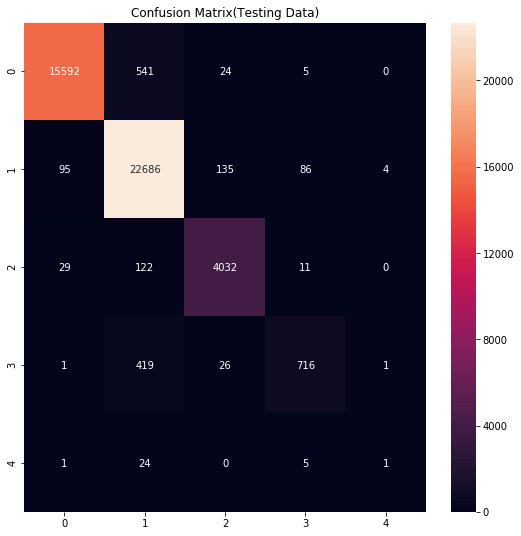

In [442]:
#Heatmap for Confusion matrix(Random Forest)
sb.heatmap(Conf_Matrix_SVC_test, annot=True,  fmt='');
title = 'Confusion Matrix(Testing Data)'
plt.title(title);
rcParams['figure.figsize'] = 9,9

In [71]:
#Classification report(For testing data)
print(classification_report(y3_test,y3_test_predict))

             precision    recall  f1-score   support

          0       0.99      0.97      0.98     16162
          1       0.97      0.98      0.97     23006
          2       0.97      0.97      0.97      4194
          3       0.77      0.78      0.77      1163
          4       0.00      0.00      0.00        31

avg / total       0.97      0.97      0.97     44556



## Calculating other metrics

- TP - True Positive
- TN - True Negative
- FP - False Positive
- FN - False Negative

### Class - 'Dos'

In [444]:
# Calculating metrics for class '0' - Dos

TP1 = Conf_Matrix_SVC_test[0,0]
TN1 = Conf_Matrix_SVC_test[1,1] + Conf_Matrix_SVC_test[1,2] + Conf_Matrix_SVC_test[1,3] + Conf_Matrix_SVC_test[1,4] + Conf_Matrix_SVC_test[2,1] + Conf_Matrix_SVC_test[2,2] + Conf_Matrix_SVC_test[2,3] + Conf_Matrix_SVC_test[2,4] + Conf_Matrix_SVC_test[3,1] + Conf_Matrix_SVC_test[3,2] + Conf_Matrix_SVC_test[3,3] + Conf_Matrix_SVC_test[3,4] + Conf_Matrix_SVC_test[4,1] + Conf_Matrix_SVC_test[4,2] + Conf_Matrix_SVC_test[4,3] + Conf_Matrix_SVC_test[4,4]
FP1 = Conf_Matrix_SVC_test[1,0] + Conf_Matrix_SVC_test[2,0] + Conf_Matrix_SVC_test[3,0] + Conf_Matrix_SVC_test[4,0]
FN1 = Conf_Matrix_SVC_test[0,1] + Conf_Matrix_SVC_test[0,2] + Conf_Matrix_SVC_test[0,3] + Conf_Matrix_SVC_test[0,4]

In [445]:
# Sensitivity of class '0'

TP1 / float(TP1+FN1)

0.9647320876129192

In [446]:
# Specificity of class '0'

TN1 / float(TN1+FP1)

0.9955624427695993

In [447]:
# False positive rate for class '0'

print(FP1/ float(TN1+FP1))

0.004437557230400789


In [448]:
# Positive predictive value for class '0'

print (TP1 / float(TP1+FP1))

0.9919837129405776


In [449]:
# Negative predictive value for class '0'
print (TN1 / float(TN1+ FN1))

0.9802344129273874


### Class - 'Normal'

In [450]:
# Calculating metrics for class '1' - Normal

TP2 = Conf_Matrix_SVC_test[1,1]
TN2 = Conf_Matrix_SVC_test[1,0] + Conf_Matrix_SVC_test[1,2] + Conf_Matrix_SVC_test[1,3] + Conf_Matrix_SVC_test[1,4] + Conf_Matrix_SVC_test[2,0] + Conf_Matrix_SVC_test[2,2] + Conf_Matrix_SVC_test[2,3] + Conf_Matrix_SVC_test[2,4] + Conf_Matrix_SVC_test[3,0] + Conf_Matrix_SVC_test[3,2] + Conf_Matrix_SVC_test[3,3] + Conf_Matrix_SVC_test[3,4] + Conf_Matrix_SVC_test[4,0] + Conf_Matrix_SVC_test[4,2] + Conf_Matrix_SVC_test[4,3] + Conf_Matrix_SVC_test[4,4]
FP2 = Conf_Matrix_SVC_test[0,1] + Conf_Matrix_SVC_test[2,1] + Conf_Matrix_SVC_test[3,1] + Conf_Matrix_SVC_test[4,1]
FN2 = Conf_Matrix_SVC_test[1,0] + Conf_Matrix_SVC_test[1,2] + Conf_Matrix_SVC_test[1,3] + Conf_Matrix_SVC_test[1,4]

In [452]:
# Sensitivity of class '1'

TP2 / float(TP2+FN2)

0.9860905850647658

In [453]:
# Specificity of class '1'

TN2 / float(TN2+FP2)

0.823011681869099

In [454]:
# False positive rate for class '1'

print(FP2/ float(TN2+FP2))

0.17698831813090093


In [455]:
# Positive predictive value for class '1'

print (TP2 / float(TP2+FP2))

0.9535137861466039


In [456]:
# Negative predictive value for class '1'
print (TN2 / float(TN2+ FN2))

0.9414241259381292


### Class - 'Probe'

In [457]:
# Calculating metrics for class '2' - Probe

TP3 = Conf_Matrix_SVC_test[2,2]
TN3 = Conf_Matrix_SVC_test[0,0] + Conf_Matrix_SVC_test[0,1] + Conf_Matrix_SVC_test[0,3] + Conf_Matrix_SVC_test[0,4] + Conf_Matrix_SVC_test[1,0] + Conf_Matrix_SVC_test[1,1] + Conf_Matrix_SVC_test[1,3] + Conf_Matrix_SVC_test[1,4] + Conf_Matrix_SVC_test[3,0] + Conf_Matrix_SVC_test[3,1] + Conf_Matrix_SVC_test[3,3] + Conf_Matrix_SVC_test[3,4] + Conf_Matrix_SVC_test[4,0] + Conf_Matrix_SVC_test[4,1] + Conf_Matrix_SVC_test[4,3] + Conf_Matrix_SVC_test[4,4]
FP3 = Conf_Matrix_SVC_test[0,2] + Conf_Matrix_SVC_test[1,2] + Conf_Matrix_SVC_test[3,2] + Conf_Matrix_SVC_test[4,2]
FN3 = Conf_Matrix_SVC_test[2,0] + Conf_Matrix_SVC_test[2,1] + Conf_Matrix_SVC_test[2,3] + Conf_Matrix_SVC_test[2,4]

In [458]:
# Sensitivity of class '2'

TP3 / float(TP3 + FN3)

0.9613733905579399

In [459]:
# Specificity of class '2'

TN3 / float(TN3+FP3)

0.9954164808483227

In [460]:
# False positive rate for class '2'

print(FP3/ float(TN3+FP3))

0.00458351915167732


In [461]:
# Positive predictive value for class '2'

print (TP3 / float(TP3+FP3))

0.9561299502015651


In [462]:
# Negative predictive value for class '2'
print (TN3 / float(TN3 + FN3))

0.9959840353008255


### Class - 'R2L'

In [463]:
# Calculating metrics for class '3' - R2L

TP4 = Conf_Matrix_SVC_test[3,3]
TN4 = Conf_Matrix_SVC_test[0,0] + Conf_Matrix_SVC_test[0,1] + Conf_Matrix_SVC_test[0,2] + Conf_Matrix_SVC_test[0,4] + Conf_Matrix_SVC_test[1,0] + Conf_Matrix_SVC_test[1,1] + Conf_Matrix_SVC_test[1,2] + Conf_Matrix_SVC_test[1,4] + Conf_Matrix_SVC_test[2,0] + Conf_Matrix_SVC_test[2,1] + Conf_Matrix_SVC_test[2,2] + Conf_Matrix_SVC_test[2,4] + Conf_Matrix_SVC_test[4,0] + Conf_Matrix_SVC_test[4,1] + Conf_Matrix_SVC_test[4,2] + Conf_Matrix_SVC_test[4,4]
FP4 = Conf_Matrix_SVC_test[0,3] + Conf_Matrix_SVC_test[1,3] + Conf_Matrix_SVC_test[2,3] + Conf_Matrix_SVC_test[4,3]
FN4 = Conf_Matrix_SVC_test[3,0] + Conf_Matrix_SVC_test[3,1] + Conf_Matrix_SVC_test[3,2] + Conf_Matrix_SVC_test[3,4]

In [464]:
# Sensitivity of class '3'

TP4 / float(TP4 + FN4)

0.6156491831470335

In [465]:
# Specificity of class '3'

TN4 / float(TN4+FP4)

0.9975341644965778

In [466]:
# False positive rate for class '3'

print(FP4/ float(TN4 + FP4))

0.002465835503422211


In [467]:
# Positive predictive value for class '3'

print (TP4 / float(TP4 + FP4))

0.8699878493317132


In [468]:
# Negative predictive value for class '3'
print (TN4 / float(TN4 + FN4))

0.9897788855097981


### Class - 'U2R'

In [469]:
# Calculating metrics for class '4' - U2R

TP5 = Conf_Matrix_SVC_test[4,4]
TN5 = Conf_Matrix_SVC_test[0,0] + Conf_Matrix_SVC_test[0,1] + Conf_Matrix_SVC_test[0,2] + Conf_Matrix_SVC_test[0,3] + Conf_Matrix_SVC_test[1,0] + Conf_Matrix_SVC_test[1,1] + Conf_Matrix_SVC_test[1,2] + Conf_Matrix_SVC_test[1,3] + Conf_Matrix_SVC_test[2,0] + Conf_Matrix_SVC_test[2,1] + Conf_Matrix_SVC_test[2,2] + Conf_Matrix_SVC_test[2,3] + Conf_Matrix_SVC_test[3,0] + Conf_Matrix_SVC_test[3,1] + Conf_Matrix_SVC_test[3,2] + Conf_Matrix_SVC_test[3,3]
FP5 = Conf_Matrix_SVC_test[0,4] + Conf_Matrix_SVC_test[1,4] + Conf_Matrix_SVC_test[2,4] + Conf_Matrix_SVC_test[3,4]
FN5 = Conf_Matrix_SVC_test[4,0] + Conf_Matrix_SVC_test[4,1] + Conf_Matrix_SVC_test[4,2] + Conf_Matrix_SVC_test[4,3]

In [470]:
# Sensitivity of class '4'

TP5 / float(TP5 + FN5)

0.03225806451612903

In [471]:
# Specificity of class '4'

TN5 / float(TN5+FP5)

0.9998877035373386

In [472]:
# False positive rate for class '4'

print(FP5/ float(TN5 + FP5))

0.00011229646266142616


In [473]:
# Positive predictive value for class '4'

print (TP5 / float(TP5 + FP5))

0.16666666666666666


In [474]:
# Negative predictive value for class '4'
print (TN5 / float(TN5 + FN5))

0.9993265993265993


## Plotting ROC curve

In [475]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from sklearn.multiclass import OneVsRestClassifier

In [476]:
y4 = label_binarize(y3, classes = [0,1,2,3,4])

In [477]:
n_classes = y4.shape[1]

In [478]:
print(n_classes)

5


In [479]:
X4_train = X3_train[col2]

In [480]:
X4_train.head()

,service,src_bytes,dst_bytes,count,srv_count,diff_srv_rate,dst_host_srv_count,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_srv_serror_rate,Normal
3848,24,-0.007205,0.005081,-0.696008,-0.335270,-0.348071,1.217831,-0.432747,-0.375568,0.366081,-0.584899,1
63237,20,-0.007260,-0.005306,-0.696008,-0.348471,-0.348071,0.174946,-0.018835,0.661691,-0.188409,-0.561633,1
82734,24,-0.007262,-0.005306,-0.704548,-0.361672,-0.348071,1.145908,-0.432747,-0.116253,2.121967,-0.584899,0
114184,19,-0.007262,-0.005306,1.481709,-0.308869,-0.092424,-1.029766,-0.174052,-0.472811,-0.280824,1.741729,0
63773,60,-0.007262,-0.005306,1.678130,-0.361672,-0.092424,-1.065728,-0.174052,-0.472811,-0.280824,1.741729,0


In [481]:
X4_train.shape

(103961, 12)

In [482]:
X4_test = X3_test[col2]

In [486]:
random_state = np.random.RandomState(0)

In [487]:
# Calling the API
classifier = OneVsRestClassifier(svm.SVC(kernel='linear', probability=True,random_state=random_state))

In [ ]:
y4_score = classifier.fit(X4_train, y3_train).decision_function(X4_test)

In [ ]:
# Plotting the curve

fpr = dict()
tpr = dict()
roc_auc = dict()

In [ ]:
for i in range(n_classes):
    fpr[i],tpr[i], _ = roc_curve(y3_test[:,i], y4_score[:,i])
    roc_auc[i] = auc(fpr[i],tpr[i])
colors = cycle(['red','blue','green','darkorange','cornflowerblue'])

for i, color in zip(range(n_classes),colors):
    plt.plot(fpr[i],tpr[i],color = color, lw = lw, label = 'ROC curve of class {0} (area = {1:0.2f})'.format(i,roc_auc[i]))
plt.plot([0,1],[0,1],'k--',lw = lw)
plt.xlim([-0.05,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False positive Rate')
plt.ylabel('True Positive Rate')

## Using RandomSearchCV on SVM algorithm - Model Tuning

In [72]:
# Selecting parameters
parameters = {'kernel': ['rbf'], 'gamma': [0.1,1,5],
                     'C': [ 0.1,1,100, 1000,]}

In [73]:
grid_model = RandomizedSearchCV(SVC(), parameters)

In [ ]:
# Training
grid_model.fit(X3_train,y3_train)

In [ ]:
print(grid_model.best_score_)

In [ ]:
print(grid_model.best_params_)

In [ ]:
# Prediction
y3rcv_predict = grid_model.predict(X3_test.values)

In [ ]:
print(accuracy_score(y3_test,y3rcv_predict))

In [ ]:
print(classification_report(y3_test,y3rcv_predict))

In [ ]:
# Training SVC model on modified parameters
model_rSVC = SVC(kernel='rbf',gamma=0.1,C=1)
model_rSVC.fit(X3_train, y3_train)

In [ ]:
# Prediction
y3rcv_predict = model_rSVC.predict(X3_test)

In [ ]:
print(accuracy_score(y3_test,y3rcv_predict))

In [ ]:
print(classification_report(y3_test,y3rcv_predict))

## Exporting the models

In [ ]:
# Exporting the models

from sklearn.externals import joblib

joblib.dump(logm2, "Binomial_Classification.cls")

In [ ]:
joblib.dump(model_RF1, "Multinomial_Classification1.cls")

In [ ]:
joblib.dump(model_SVC, "Multinomial_Classification2.cls")

## Important points

- The output for SMOTE analysis has not been performed here because of import issue related to package IMBLEARN.
- The output for Multi-Class ROC curve has not been shown here due to system limitations. The examiner is expected to run the code for the same in  order to get required output.
- The output for model tuning part is not shown here due to system limitations.The examiner is expected to run the code for the same in  order to get required output.
- Please note that the model export feature(shown above) is an additional part of this model.
- Please install imblearn package in order to run SMOTE technique.
- System requirements to run this model - 8GB of RAM, Processor - Preferably i5/i7, Python version - 3 or above.